## **Install and Importing Necessary Libraries**

In [ ]:
!pip install shap
!pip install keras-tuner
!pip install visualkeras
!pip install lime
!pip install --upgrade shap

In [ ]:
import pandas as pd
import numpy as np
import os
import joblib
import shap
from scipy import stats
from datetime import datetime
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
import pickle
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Bidirectional, Dropout, Dense, Attention, Concatenate, Flatten
from tensorflow.keras.callbacks import Callback
import keras_tuner as kt
from tensorflow.keras.models import load_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model
import visualkeras
from tensorflow.keras.models import load_model
from PIL import ImageFont
from lime.lime_tabular import LimeTabularExplainer
import random

## **Loading and Preprocessing the data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
## Loading the data
path ='/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Data/Dhaka_3_Hourly_Dew_Point_Temperature.csv'
df = pd.read_csv(path)
df

,Index,Year,Month,Time,1,2,3,4,5,6,...,22,23,24,25,26,27,28,29,30,31
0,11111,1980,1,0,10,12,14,13,12,12,...,9,10,12,9,11,11,17,14,11,8
1,11111,1980,1,3,15,14,15,15,14,12,...,14,15,15,10,14,13,20,16,6,8
2,11111,1980,1,6,12,14,15,11,14,10,...,8,14,8,7,11,9,19,7,1,*****
3,11111,1980,1,9,10,15,15,9,11,11,...,6,11,6,6,11,11,7,6,*****,4
4,11111,1980,1,12,12,15,17,12,14,13,...,11,13,11,12,13,14,12,8,6,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4219,11111,2023,12,9,14,17,16,18,18,20,...,17,18,16,17,16,18,17,16,14,18
4220,11111,2023,12,12,15,18,19,18,18,20,...,16,16,16,18,18,17,17,17,17,17
4221,11111,2023,12,15,16,17,17,17,18,18,...,17,17,17,18,18,17,17,17,17,16
4222,11111,2023,12,18,16,17,16,17,18,20,...,17,18,17,18,18,17,17,18,18,16


In [ ]:
# Melt the DataFrame into a long format
df_dew = pd.melt(df, id_vars=['Index', 'Year', 'Month', 'Time'], var_name='Day', value_name='DewPointTemperature')
df_dew

,Index,Year,Month,Time,Day,DewPointTemperature
0,11111,1980,1,0,1,10
1,11111,1980,1,3,1,15
2,11111,1980,1,6,1,12
3,11111,1980,1,9,1,10
4,11111,1980,1,12,1,12
...,...,...,...,...,...,...
130939,11111,2023,12,9,31,18
130940,11111,2023,12,12,31,17
130941,11111,2023,12,15,31,16
130942,11111,2023,12,18,31,16


In [ ]:
## Find the datatypes of the columns again
df_dew.dtypes

,0
Index,int64
Year,int64
Month,int64
Time,int64
Day,object
DewPointTemperature,object


In [ ]:
# Find unique values in 'Year column
df_dew['Year'].unique()

array([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
       2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023])

In [ ]:
# Find unique values in 'Month column
df_dew['Month'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [ ]:
# Find unique values in 'Time' column
df_dew['Time'].unique()

array([ 0,  3,  6,  9, 12, 15, 18, 21])

In [ ]:
# Find unique values in 'Day' column
df_dew['Day'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23',
       '24', '25', '26', '27', '28', '29', '30', '31'], dtype=object)

In [ ]:
# Convert the Day column to numeric
df_dew['Day'] = pd.to_numeric(df_dew['Day'])
df_dew

,Index,Year,Month,Time,Day,DewPointTemperature
0,11111,1980,1,0,1,10
1,11111,1980,1,3,1,15
2,11111,1980,1,6,1,12
3,11111,1980,1,9,1,10
4,11111,1980,1,12,1,12
...,...,...,...,...,...,...
130939,11111,2023,12,9,31,18
130940,11111,2023,12,12,31,17
130941,11111,2023,12,15,31,16
130942,11111,2023,12,18,31,16


In [ ]:
## Find the datatypes of the columns again
df_dew.dtypes

,0
Index,int64
Year,int64
Month,int64
Time,int64
Day,int64
DewPointTemperature,object


In [ ]:
# Find unique values in 'DewPointTemperature' column
df_dew['DewPointTemperature'].unique()

array(['10', '15', '12', '14', '13', '8', '6', '9', '18', '19', '17',
       '*****', '16', '20', '21', '24', '23', '25', '26', '27', '22',
       '11', '18.9', '26.7', '25.6', '25.8', '7', '2', '5', '21.9',
       '22.8', '26.9', '3', '4', '28', '24.6', '20.8', '18.5', '16.5',
       '29', '24.8', '12.5', '25.5', '1', '26.5', '27.7', '24.9', '24.7',
       '15.6', '27.8', '25.7', '23.5', '25.9', '22.6', '21.6', '13.5',
       '14.5', '13.7', '14.7', '23.7', '12.6', '24.5', '17.5', '21.5',
       '8.9', '19.5', '28.7', '27.5', '14.8', '15.8', '28.9', '12.8',
       '22.5', '9.9', '26.8', '26.6', '13.8', '18.8', '19.7', '23.9',
       '15.9', '23.6', '11.4', '11.9', '11.5', '4.6', '16.6', '30',
       '19.8', '11.8', '15.7', '12.9', '31', '16.9', '23.8', '17.9',
       '12.7', '5.8', '18.7', '20.9', '20.6', '20.5', '27.6', '10.8',
       '22.7', '7.5', '17.8', '10.5', '16.8', '17.6', '21.7', '14.6',
       '9.5', '15.5', '22.9', '18.6', '19.4', '11.7', '24.3', '10.6',
       '0.1', '19.

In [ ]:
## Count the number of '****' in the value column
df_dew['DewPointTemperature'][df_dew['DewPointTemperature'] == '*****'].count()

983

In [ ]:
# To find the null values
df_dew.isnull().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,2376


In [ ]:
# To find the NaN values
df_dew.isna().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,2376


In [ ]:
# Replace '****' with NaN in the original DataFrame
df_dew.loc[df_dew['DewPointTemperature'] == '*****', 'DewPointTemperature'] = np.nan

# Drop the rows with NaN in the 'Value' column
df_dew = df_dew.dropna(subset=['DewPointTemperature'])

In [ ]:
## Count the number of '****' in the value column
df_dew['DewPointTemperature'][df_dew['DewPointTemperature'] == '*****'].count()

0

In [ ]:
# To find the null values
df_dew.isnull().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,0


In [ ]:
# To find the null values
df_dew.isna().sum()

,0
Index,0
Year,0
Month,0
Time,0
Day,0
DewPointTemperature,0


In [ ]:
## Count the number of '****' in the value column
df_dew['DewPointTemperature'][df_dew['DewPointTemperature'] == '*'].count()

0

In [ ]:
# Convert 'DewPointTemperature' column to numeric in the original DataFrame
df_dew['DewPointTemperature'] = pd.to_numeric(df_dew['DewPointTemperature'], errors='coerce')

<ipython-input-45-ba111a5de3e6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dew['DewPointTemperature'] = pd.to_numeric(df_dew['DewPointTemperature'], errors='coerce')


In [ ]:
## Find the datatypes of the columns again
df_dew.dtypes

,0
Index,int64
Year,int64
Month,int64
Time,int64
Day,int64
DewPointTemperature,float64


In [ ]:
df_dew = df_dew.drop(columns=['Index'])

In [ ]:
df_dew = df_dew[['Year', 'Month', 'Day', 'Time', 'DewPointTemperature']]

In [ ]:
df_dew

,Year,Month,Day,Time,DewPointTemperature
0,1980,1,1,0,10.0
1,1980,1,1,3,15.0
2,1980,1,1,6,12.0
3,1980,1,1,9,10.0
4,1980,1,1,12,12.0
...,...,...,...,...,...
130939,2023,12,31,9,18.0
130940,2023,12,31,12,17.0
130941,2023,12,31,15,16.0
130942,2023,12,31,18,16.0


In [ ]:
# describe() function to get the descriptive statistics of the dataset. This can help identify values that are out of range.
df_dew.describe()

,Year,Month,Day,Time,DewPointTemperature
count,127585.000000,127585.000000,127585.000000,127585.000000,127585.000000
mean,2001.636830,6.528322,15.728189,10.437536,20.422832
std,12.631964,3.448040,8.800813,6.848463,5.575558
min,1980.000000,1.000000,1.000000,0.000000,0.100000
25%,1991.000000,4.000000,8.000000,3.000000,16.000000
50%,2002.000000,7.000000,16.000000,9.000000,22.000000
75%,2013.000000,10.000000,23.000000,15.000000,25.000000
max,2023.000000,12.000000,31.000000,21.000000,31.000000


In [ ]:
df_dew.corr()

,Year,Month,Day,Time,DewPointTemperature
Year,1.000000,-0.000649,0.000302,0.015513,0.010955
Month,-0.000649,1.000000,0.010786,0.000226,0.266369
Day,0.000302,0.010786,1.000000,0.000068,-0.002432
Time,0.015513,0.000226,0.000068,1.000000,0.029137
DewPointTemperature,0.010955,0.266369,-0.002432,0.029137,1.000000



## **Feature Engineering**

In [ ]:
df_dew['Year'] = df_dew['Year'].astype(int)
df_dew['Month'] = df_dew['Month'].astype(int)
df_dew['Day'] = df_dew['Day'].astype(int)


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.fftpack import fft

# Define function to determine the season based on month and day
def get_season(month, day):
    if (month == 11) or (month == 12) or (month == 1) or (month == 2):
        return 'Winter'
    elif (month >= 3 and month <= 6):
        return 'Summer'
    elif (month >= 7 and month <= 10):
        return 'Rainy'
    return 'Unknown'

# Create Date and other features
def create_date(row):
    try:
        return datetime(year=int(row['Year']), month=int(row['Month']), day=int(row['Day']))
    except Exception as e:
        print(f"Error creating date for row: {row}, Error: {e}")
        return pd.NaT  # Return Not a Time if there's an error

# Define function to categorize day or night
def day_or_night(hour):
    if 6 <= hour < 18:
        return 'Day'
    else:
        return 'Night'

# Apply functions and check for NaT values
df_dew['Date'] = df_dew.apply(create_date, axis=1)
print(df_dew['Date'].isna().sum())

df_dew['DayOfYear'] = df_dew['Date'].dt.dayofyear
df_dew['Year'] = df_dew['Year'] - df_dew['Year'].min()  # Normalize the year

# Add season
df_dew['Season'] = df_dew.apply(lambda row: get_season(row['Month'], row['Day']), axis=1)

# One-Hot Encoding for Season
df_dew = pd.get_dummies(df_dew, columns=['Season'], prefix='Season')

# Convert boolean to numeric for season columns
season_columns = [col for col in df_dew.columns if col.startswith('Season_')]
df_dew[season_columns] = df_dew[season_columns].astype(int)

# Cyclical Encoding for Month
df_dew['Month_sin'] = np.sin(2 * np.pi * df_dew['Month'] / 12)
df_dew['Month_cos'] = np.cos(2 * np.pi * df_dew['Month'] / 12)

# Cyclical Encoding for time
df_dew['Time_sin'] = np.sin(2 * np.pi * df_dew['Time'] / 24)
df_dew['Time_cos'] = np.cos(2 * np.pi * df_dew['Time'] / 24)

# Add Day/Night feature
df_dew['DayOrNight'] = df_dew['Time'].apply(day_or_night)

# One-Hot Encoding for Day/Night
df_dew = pd.get_dummies(df_dew, columns=['DayOrNight'], prefix='DayOrNight')

# Convert boolean to numeric for day/night columns
day_night_columns = [col for col in df_dew.columns if col.startswith('DayOrNight_')]
df_dew[day_night_columns] = df_dew[day_night_columns].astype(int)

# Seasonal decomposition
df_dew = df_dew.sort_values(by='Date')
df_dew.set_index('Date', inplace=True)

# Perform seasonal decomposition
decomposition = seasonal_decompose(df_dew['DewPointTemperature'].dropna(), model='additive', period=8)  # period = 8 (since you have 8 observations per day)

# Add decomposition components to the DataFrame
df_dew['Trend'] = decomposition.trend

# Drop NaN values resulting from the decomposition
df_dew.dropna(inplace=True)

# Define features and target
features = df_dew[['Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']]
target = df_dew['DewPointTemperature']



0


In [ ]:
features.head()

,Year,Month_sin,Month_cos,DayOfYear,Time_sin,Time_cos,DayOrNight_Day,DayOrNight_Night,Season_Rainy,Season_Summer,Season_Winter,Trend
Date,,,,,,,,,,,,
1980-01-01,0,0.5,0.866025,1,1.224647e-16,-1.000000e+00,1,0,0,0,1,12.5000
1980-01-01,0,0.5,0.866025,1,-7.071068e-01,-7.071068e-01,1,0,0,0,1,12.7500
1980-01-01,0,0.5,0.866025,1,-1.000000e+00,-1.836970e-16,0,1,0,0,1,12.9375
1980-01-01,0,0.5,0.866025,1,-7.071068e-01,7.071068e-01,0,1,0,0,1,13.4375
1980-01-02,0,0.5,0.866025,2,1.000000e+00,6.123234e-17,1,0,0,0,1,13.9750


In [ ]:
features.shape

(127577, 12)

In [ ]:
df_dew

,Year,Month,Day,Time,DewPointTemperature,DayOfYear,Season_Rainy,Season_Summer,Season_Winter,Month_sin,Month_cos,Time_sin,Time_cos,DayOrNight_Day,DayOrNight_Night,Trend
Date,,,,,,,,,,,,,,,,
1980-01-01,0,1,1,12,12.0,1,0,0,1,5.000000e-01,0.866025,1.224647e-16,-1.000000e+00,1,0,12.5000
1980-01-01,0,1,1,15,14.0,1,0,0,1,5.000000e-01,0.866025,-7.071068e-01,-7.071068e-01,1,0,12.7500
1980-01-01,0,1,1,18,13.0,1,0,0,1,5.000000e-01,0.866025,-1.000000e+00,-1.836970e-16,0,1,12.9375
1980-01-01,0,1,1,21,12.0,1,0,0,1,5.000000e-01,0.866025,-7.071068e-01,7.071068e-01,0,1,13.4375
1980-01-02,0,1,2,6,14.0,2,0,0,1,5.000000e-01,0.866025,1.000000e+00,6.123234e-17,1,0,13.9750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-30,43,12,30,3,17.0,364,0,0,1,-2.449294e-16,1.000000,7.071068e-01,7.071068e-01,0,1,16.6875
2023-12-31,43,12,31,18,16.0,365,0,0,1,-2.449294e-16,1.000000,-1.000000e+00,-1.836970e-16,0,1,16.9375
2023-12-31,43,12,31,0,17.0,365,0,0,1,-2.449294e-16,1.000000,0.000000e+00,1.000000e+00,0,1,17.0000


In [ ]:
# Calculate correlation matrix
correlation_matrix = features.copy()
correlation_matrix['DewPointTemperature'] = target
correlation_matrix = correlation_matrix.corr()

# Print correlation with the target variable
print(correlation_matrix['DewPointTemperature'].sort_values(ascending=False))

DewPointTemperature    1.000000
Trend                  0.955771
Season_Rainy           0.550191
DayOfYear              0.262279
Season_Summer          0.188341
DayOrNight_Night       0.079704
Time_cos               0.057223
Year                   0.010910
Time_sin              -0.079286
DayOrNight_Day        -0.079704
Month_sin             -0.488098
Month_cos             -0.692301
Season_Winter         -0.742628
Name: DewPointTemperature, dtype: float64


## **Scaling the dataset**

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler for features
Dhaka_dew_point_feature_scaler = MinMaxScaler()
features_scaled = Dhaka_dew_point_feature_scaler.fit_transform(features)

# Initialize the MinMaxScaler for the target
Dhaka_dew_point_target_scaler = MinMaxScaler()
target_scaled = target.values.reshape(-1, 1)
target_scaled = Dhaka_dew_point_target_scaler.fit_transform(target_scaled)


In [ ]:
features_scaled

array([[0.        , 0.75      , 0.9330127 , ..., 0.        , 1.        ,
        0.38104543],
       [0.        , 0.75      , 0.9330127 , ..., 0.        , 1.        ,
        0.39081583],
       [0.        , 0.75      , 0.9330127 , ..., 0.        , 1.        ,
        0.39814362],
       ...,
       [1.        , 0.5       , 1.        , ..., 0.        , 1.        ,
        0.55691255],
       [1.        , 0.5       , 1.        , ..., 0.        , 1.        ,
        0.55202736],
       [1.        , 0.5       , 1.        , ..., 0.        , 1.        ,
        0.54225696]])

In [ ]:
target_scaled

array([[0.38511327],
       [0.44983819],
       [0.41747573],
       ...,
       [0.54692557],
       [0.51456311],
       [0.54692557]])

## Saving the Scaled features and targets

In [ ]:
import os

# Define the directory path
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/'

# Create the directory if it doesn't exist
os.makedirs(directory, exist_ok=True)

# Save the scaled features
np.save(os.path.join(directory, 'features_scaled.npy'), features_scaled)

# Save the scaled target
np.save(os.path.join(directory, 'target_scaled.npy'), target_scaled)

## Saving the Scaler

In [ ]:
# Define the directory to save the scalers
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/'

# Create the directory if it does not exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Save the feature scaler
feature_scaler_path = f'{directory}Dhaka_dew_point_feature_scaler.pkl'
joblib.dump(Dhaka_dew_point_feature_scaler, feature_scaler_path)

# Save the target scaler
target_scaler_path = f'{directory}Dhaka_dew_point_target_scaler.pkl'
joblib.dump(Dhaka_dew_point_target_scaler, target_scaler_path)

print(f"Scalers saved to {directory}")


Scalers saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/


In [ ]:
features_scaled.shape

(127577, 12)

## Splitting the data

In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    features_scaled, target_scaled, test_size=0.2, random_state=42
)


# For simplicity, we use time_steps = 1 since each row is a separate observation
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

In [ ]:
X_train.shape

(102061, 1, 12)

In [ ]:
X_test.shape

(25516, 1, 12)

In [ ]:
y_train.shape

(102061, 1)

## Saving the train and test data

In [ ]:
# Define the save directory in Google Drive
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'
os.makedirs(save_dir, exist_ok=True)

# Save the reshaped arrays to Google Drive
np.save(os.path.join(save_dir, 'X_train.npy'), X_train)
np.save(os.path.join(save_dir, 'X_test.npy'), X_test)
np.save(os.path.join(save_dir, 'y_train.npy'), y_train)
np.save(os.path.join(save_dir, 'y_test.npy'), y_test)

print("Data saved to Google Drive.")

Data saved to Google Drive.


## Loading the train and test data

In [ ]:
# Define the directory where the data is saved
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'

# Load the reshaped arrays from Google Drive
X_train = np.load(os.path.join(save_dir, 'X_train.npy'))
X_test = np.load(os.path.join(save_dir, 'X_test.npy'))
y_train = np.load(os.path.join(save_dir, 'y_train.npy'))
y_test = np.load(os.path.join(save_dir, 'y_test.npy'))

print("Data loaded from Google Drive.")

Data loaded from Google Drive.


## **Hyperparameter Training**

In [ ]:
import numpy as np
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dropout, Flatten, Dense, Add, MultiHeadAttention
import keras_tuner as kt
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
import shutil

# # Remove previous tuner directory if it exists
# tuner_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Tuning_Results/Version_2/'
# if os.path.exists(tuner_dir):
#     shutil.rmtree(tuner_dir)

# Define the save directory in Google Drive
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Tuning_Results/Version_2/'
os.makedirs(save_dir, exist_ok=True)

# Custom Metric Functions
def rmse(y_true, y_pred):
    """Calculate Root Mean Squared Error."""
    return np.sqrt(mean_squared_error(y_true, y_pred))

def adjusted_r_squared(y_true, y_pred, n, p):
    """Calculate Adjusted R-Squared."""
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Custom Callback to Track Additional Metrics
class MetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data):
        super().__init__()
        self.validation_data = validation_data
        self.val_rmse = []
        self.val_mape = []
        self.val_r2 = []
        self.val_adjusted_r2 = []

    def on_epoch_end(self, epoch, logs=None):
        X_val, y_val_true = self.validation_data
        y_val_pred = self.model.predict(X_val)

        rmse_value = rmse(y_val_true, y_val_pred)
        mape_value = mean_absolute_percentage_error(y_val_true, y_val_pred)
        r2_value = r2_score(y_val_true, y_val_pred)
        adjusted_r2_value = adjusted_r_squared(y_val_true, y_val_pred, len(y_val_true), X_train.shape[2])

        self.val_rmse.append(rmse_value)
        self.val_mape.append(mape_value)
        self.val_r2.append(r2_value)
        self.val_adjusted_r2.append(adjusted_r2_value)

        print(f"Epoch {epoch+1}: val_rmse: {rmse_value:.4f} - val_mape: {mape_value:.4f} - val_r2: {r2_value:.4f} - val_adjusted_r2: {adjusted_r2_value:.4f}")

# Define a function to build the TCN model with Multi-Head Attention
def build_model(hp):
    inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))  # (time_steps, features)

    # Initial convolution layer
    x = Conv1D(
        filters=hp.Int('filters', min_value=64, max_value=256, step=64),
        kernel_size=hp.Choice('kernel_size', values=[2, 3, 5]),
        padding='causal',
        activation='relu',
        kernel_regularizer=regularizers.l2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='log'))
    )(inputs)

    residual = x  # Store the initial x for the residual connection

    # Add TCN layers with dilation
    for i in range(hp.Int('num_layers', min_value=2, max_value=5)):
        x = Conv1D(
            filters=hp.Int('filters', min_value=64, max_value=256, step=64),
            kernel_size=hp.Choice('kernel_size', values=[2, 3, 5]),
            dilation_rate=2**i,
            padding='causal',
            activation='relu',
            kernel_regularizer=regularizers.l2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='log'))
        )(x)
        x = Dropout(rate=hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1))(x)

        # Adjust residual connection to match the shape
        if residual.shape[1] != x.shape[1]:
            residual = Conv1D(filters=x.shape[2], kernel_size=1, padding='same')(residual)

        x = Add()([x, residual])  # Residual connection
        residual = x  # Update residual for the next layer

    # Apply Multi-Head Attention
    attention_output = MultiHeadAttention(
        num_heads=hp.Int('num_heads', min_value=2, max_value=8, step=2),
        key_dim=hp.Int('key_dim', min_value=16, max_value=64, step=16)
    )(x, x)
    attention_output = Dropout(rate=hp.Float('attention_dropout', min_value=0.2, max_value=0.5, step=0.1))(attention_output)

    # Add residual connection after attention
    x = Add()([x, attention_output])

    # Flatten and Dense layers
    x = Flatten()(x)
    x = Dense(
        units=hp.Int('dense_units', min_value=16, max_value=128, step=16),
        activation='relu'
    )(x)
    x = Dropout(rate=hp.Float('dropout_rate2', min_value=0.2, max_value=0.5, step=0.1))(x)
    outputs = Dense(1)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')),
        loss='mean_squared_error',
        metrics=['mean_absolute_error']
    )

    return model

# Reshape data for Conv1D
X_train_tcn = X_train.reshape((X_train.shape[0], X_train.shape[1], X_train.shape[2]))
X_test_tcn = X_test.reshape((X_test.shape[0], X_test.shape[1], X_test.shape[2]))

# Further split the training data into train and validation sets
val_split = 0.2
val_size = int(len(X_train_tcn) * val_split)
X_val = X_train_tcn[-val_size:]
y_val = y_train[-val_size:]
X_train_new = X_train_tcn[:-val_size]
y_train_new = y_train[:-val_size]

# Initialize hyperparameter tuning
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=20,
    executions_per_trial=1,
    directory=save_dir,
    project_name='dew_point_tuning_tcn'
)

# Set up EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    mode='min'
)

# Start the search
tuner.search(
    X_train_new,
    y_train_new,
    epochs=20,
    batch_size=32,
    validation_data=(X_val, y_val),
    verbose=1,
    callbacks=[MetricsCallback(validation_data=(X_val, y_val)), early_stopping]
)

# Extract all trial results after tuning
def extract_all_trial_results(tuner):
    results_list = []
    trials = tuner.oracle.trials
    for trial in trials.values():
        hp = trial.hyperparameters.values
        metrics = {tuner.oracle.objective.name: trial.score}
        result = {**hp, **metrics}
        results_list.append(result)
    return results_list

# Save the results to a CSV file
results_list = extract_all_trial_results(tuner)
if results_list:
    results_df = pd.DataFrame(results_list)
    results_df.to_csv(os.path.join(save_dir, 'hyperparameter_results.csv'), index=False)
    print(f"Hyperparameter results saved to {os.path.join(save_dir, 'hyperparameter_results.csv')}")
else:
    print("No results to save.")


## **Loading the Optimal Hyperparameter**

In [ ]:
import pandas as pd

# Define the path to the hyperparameter results CSV file
results_csv_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Tuning Results/hyperparameter_results.csv'

# Load the results from the CSV file
results_df = pd.read_csv(results_csv_path)

# Find the row with the minimum validation loss
best_result = results_df.loc[results_df['val_loss'].idxmin()]

# Print the best result with hyperparameters
print("Best hyperparameters for the optimal validation loss:")
print(best_result)


Best hyperparameters for the optimal validation loss:
filters              192.000000
kernel_size            2.000000
l2_reg                 0.000290
num_layers             2.000000
dropout_rate           0.300000
num_heads              4.000000
key_dim               48.000000
attention_dropout      0.200000
dense_units           64.000000
dropout_rate2          0.400000
learning_rate          0.000197
val_loss               0.002168
Name: 16, dtype: float64


## **Model Trainging With Optimal Hyperparameter**

In [ ]:
import numpy as np
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv1D, Dropout, Dense, Flatten, Add, MultiHeadAttention
from tensorflow.keras import regularizers as reg
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
import pickle

# Reshape the data for Conv1D
X_train_tcn = X_train.reshape((X_train.shape[0], X_train.shape[1], X_train.shape[2]))
X_test_tcn = X_test.reshape((X_test.shape[0], X_test.shape[1], X_test.shape[2]))

def rmse(y_true, y_pred):
    """Calculate Root Mean Squared Error."""
    return np.sqrt(mean_squared_error(y_true, y_pred))

def adjusted_r_squared(y_true, y_pred, n, p):
    """Calculate Adjusted R-Squared."""
    r2 = r2_score(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Define MAPE calculation with safe clipping
def mean_absolute_percentage_error_safe(y_true, y_pred, epsilon=1e-7):
    """Calculate MAPE with clipping to avoid division by zero or near-zero values."""
    y_true = np.clip(y_true, epsilon, None)  # Clip true values to avoid division by zero
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Define the best hyperparameters
best_params = {
    'filters': 192,
    'kernel_size': 2,
    'l2_reg': 0.000290,
    'num_layers': 2,
    'dropout_rate': 0.3,
    'num_heads': 4,
    'key_dim': 48,
    'attention_dropout': 0.2,
    'dense_units': 64,
    'dropout_rate2': 0.4,
    'learning_rate': 0.000197
}

# Define the final model with the same structure as in hyperparameter training
def build_final_tcn_with_attention_model(best_params):
    inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))  # (time_steps, features)

    # Initial convolution layer
    x = Conv1D(
        filters=best_params['filters'],
        kernel_size=best_params['kernel_size'],
        padding='causal',
        activation='relu',
        kernel_regularizer=reg.l2(best_params['l2_reg'])
    )(inputs)

    residual = x  # Store the initial x for the residual connection

    # Add TCN layers with dilation and residual connections
    for i in range(best_params['num_layers']):
        x = Conv1D(
            filters=best_params['filters'],
            kernel_size=best_params['kernel_size'],
            dilation_rate=2**i,
            padding='causal',
            activation='relu',
            kernel_regularizer=reg.l2(best_params['l2_reg'])
        )(x)
        x = Dropout(rate=best_params['dropout_rate'])(x)

        # Adjust residual connection to match the shape
        if residual.shape[1] != x.shape[1]:
            residual = Conv1D(filters=x.shape[2], kernel_size=1, padding='same')(residual)

        x = Add()([x, residual])  # Residual connection
        residual = x  # Update residual for the next layer

    # Apply Multi-Head Attention
    attention_output = MultiHeadAttention(
        num_heads=best_params['num_heads'],
        key_dim=best_params['key_dim']
    )(x, x)
    attention_output = Dropout(rate=best_params['attention_dropout'])(attention_output)

    # Add residual connection after attention
    x = Add()([x, attention_output])

    # Flatten and Dense layers
    x = Flatten()(x)
    x = Dense(
        units=best_params['dense_units'],
        activation='relu'
    )(x)
    x = Dropout(rate=best_params['dropout_rate2'])(x)
    outputs = Dense(1)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
        loss='mean_squared_error',
        metrics=['mean_absolute_error']  # This will track MAE
    )

    return model

# Build the final model using the best parameters obtained during hyperparameter tuning
final_tcn_attention_model = build_final_tcn_with_attention_model(best_params)

# Split training data into train and validation sets
val_split = 0.2
val_size = int(len(X_train_tcn) * val_split)
X_val = X_train_tcn[-val_size:]
y_val = y_train[-val_size:]
X_train_new = X_train_tcn[:-val_size]
y_train_new = y_train[:-val_size]

# Define the directory and filepath for best model
best_model_directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/'
os.makedirs(best_model_directory, exist_ok=True)
best_model_filepath = os.path.join(best_model_directory, 'Dhaka_dew_point_model_best.keras')

# Create a checkpoint callback to save the best model
checkpoint_callback = ModelCheckpoint(
    filepath=best_model_filepath,
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1
)

# Define the directory and filepath for final model
final_model_directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Final/'
os.makedirs(final_model_directory, exist_ok=True)
final_model_filepath = os.path.join(final_model_directory, 'Dhaka_dew_point_model_final.keras')

# Set up EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    mode='min'
)

# Define the directory for TensorBoard logs
log_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/TensorBoard/Version_2/'
os.makedirs(log_dir, exist_ok=True)

# Create the TensorBoard callback
tensorboard_callback = TensorBoard(log_dir=log_dir,
                                   histogram_freq=1,
                                   write_graph=True,
                                   write_images=True)

class MetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data):
        super().__init__()
        self.validation_data = validation_data
        self.val_rmse = []
        self.val_mape = []
        self.val_r2 = []
        self.val_adjusted_r2 = []
        self.val_mae = []
        self.train_rmse = []
        self.train_mape = []
        self.train_r2 = []
        self.train_adjusted_r2 = []
        self.train_mae = []

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Calculate validation metrics
        X_val, y_val = self.validation_data
        y_pred_val = self.model.predict(X_val)

        val_rmse_value = rmse(y_val, y_pred_val)
        val_mape_value = mean_absolute_percentage_error_safe(y_val, y_pred_val)
        val_r2_value = r2_score(y_val, y_pred_val)
        val_adjusted_r2_value = adjusted_r_squared(y_val, y_pred_val, len(y_val), X_val.shape[1])
        val_mae_value = np.mean(np.abs(y_val - y_pred_val))

        # Store validation metrics
        self.val_rmse.append(val_rmse_value)
        self.val_mape.append(val_mape_value)
        self.val_r2.append(val_r2_value)
        self.val_adjusted_r2.append(val_adjusted_r2_value)
        self.val_mae.append(val_mae_value)

        # Calculate training metrics using X_train_new and y_train_new
        y_pred_train = self.model.predict(X_train_new)

        train_rmse_value = rmse(y_train_new, y_pred_train)
        train_mape_value = mean_absolute_percentage_error_safe(y_train_new, y_pred_train)
        train_r2_value = r2_score(y_train_new, y_pred_train)
        train_adjusted_r2_value = adjusted_r_squared(y_train_new, y_pred_train, len(y_train_new), X_train_new.shape[1])
        train_mae_value = np.mean(np.abs(y_train_new - y_pred_train))

        # Store training metrics
        self.train_rmse.append(train_rmse_value)
        self.train_mape.append(train_mape_value)
        self.train_r2.append(train_r2_value)
        self.train_adjusted_r2.append(train_adjusted_r2_value)
        self.train_mae.append(train_mae_value)

        # Print metrics for both training and validation
        print(f"Epoch {epoch + 1}: "
              f"train_rmse: {train_rmse_value:.4f}, train_mape: {train_mape_value:.4f}, "
              f"train_r2: {train_r2_value:.4f}, train_adjusted_r2: {train_adjusted_r2_value:.4f}, "
              f"train_mae: {train_mae_value:.4f}, "
              f"val_rmse: {val_rmse_value:.4f}, val_mape: {val_mape_value:.4f}, "
              f"val_r2: {val_r2_value:.4f}, val_adjusted_r2: {val_adjusted_r2_value:.4f}, "
              f"val_mae: {val_mae_value:.4f}")


metrics_callback = MetricsCallback(validation_data=(X_val, y_val))

# Train the model with callbacks (including the updated MetricsCallback)
history = final_tcn_attention_model.fit(
    X_train_new,
    y_train_new,
    epochs=100,
    batch_size=32,
    validation_data=(X_val, y_val),
    verbose=1,
    callbacks=[early_stopping, metrics_callback, checkpoint_callback, tensorboard_callback]
)

# Save the final trained model
final_tcn_attention_model.save(final_model_filepath)
print(f"Final model saved to {final_model_filepath}")

# Save the history object
history_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/History/Version_2/history.pkl'

# Ensure the directory exists
os.makedirs(os.path.dirname(history_filepath), exist_ok=True)

with open(history_filepath, 'wb') as file:
    pickle.dump(history.history, file)

print(f"Training history saved to {history_filepath}")

# Save the MetricsCallback object
metrics_callback_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Metrics_Callback/Version_2/metrics_callback.pkl'

# Ensure the directory exists
os.makedirs(os.path.dirname(metrics_callback_filepath), exist_ok=True)

with open(metrics_callback_filepath, 'wb') as file:
    pickle.dump(metrics_callback, file)

print(f"MetricsCallback object saved to {metrics_callback_filepath}")


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


 42/638 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


638/638 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
2552/2552 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step
Epoch 1: train_rmse: 0.0497, train_mape: 7.4083, train_r2: 0.9238, train_adjusted_r2: 0.9238, train_mae: 0.0363, val_rmse: 0.0496, val_mape: 7098.0227, val_r2: 0.9249, val_adjusted_r2: 0.9249, val_mae: 0.0363

Epoch 1: val_loss improved from inf to 0.01399, saving model to /content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras
2552/2552 ━━━━━━━━━━━━━━━━━━━━ 49s 17ms/step - loss: 0.0797 - mean_absolute_error: 0.1238 - val_loss: 0.0140 - val_mean_absolute_error: 0.0363
Epoch 2/100
638/638 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
2552/2552 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step
Epoch 2: train_rmse: 0.0473, train_mape: 7.1921, train_r2: 0.9311, train_adjusted_r2: 0.9311, train_mae: 0.0338, val_rmse: 0.0473, val_mape: 6906.4406, val_r2: 0.9317, val_adjusted_r2: 0.9317, val_mae: 0.0339

Epoch 2: val_loss improved from 0.01399 to 0.00473, saving model to /content/drive/MyDri

## **Loading the best model**

In [ ]:
best_model = load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')
best_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 12)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 1, 192)         │          4,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 1, 192)         │         73,920 │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 1, 192)         │              0 │ conv1d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 1, 192)         │              0 │ dropout[0][0],         │
│                           │                        │                │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 1, 192)         │         73,920 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1, 192)         │              0 │ conv1d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 1, 192)         │              0 │ dropout_1[0][0],       │
│                           │                        │                │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 1, 192)         │        148,224 │ add_1[0][0],           │
│ (MultiHeadAttention)      │                        │                │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 1, 192)         │              0 │ multi_head_attention[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 1, 192)         │              0 │ add_1[0][0],           │
│                           │                        │                │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 192)            │              0 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │         12,352 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 64)             │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │             65 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 939,845 (3.59 MB)

 Trainable params: 313,281 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 626,564 (2.39 MB)

## **Loading Training and Testing Data**

In [ ]:
# Define the directory where the data is saved
save_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'

# Load the reshaped arrays from Google Drive
X_train = np.load(os.path.join(save_dir, 'X_train.npy'))
X_test = np.load(os.path.join(save_dir, 'X_test.npy'))
y_train = np.load(os.path.join(save_dir, 'y_train.npy'))
y_test = np.load(os.path.join(save_dir, 'y_test.npy'))

print("Data loaded from Google Drive.")

Data loaded from Google Drive.


## **Loading Scaled Features and Target**

In [ ]:
import numpy as np
import os

# Define the directory path
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/'

# Load the scaled features
features_scaled = np.load(os.path.join(directory, 'features_scaled.npy'))

# Load the scaled target
target_scaled = np.load(os.path.join(directory, 'target_scaled.npy'))

# Print to verify data
print("Features Scaled:", features_scaled[:5])  # Print first 5 rows of features
print("Target Scaled:", target_scaled[:5])      # Print first 5 values of target


Features Scaled: [[0.         0.75       0.9330127  0.         0.5        0.
  1.         0.         0.         0.         1.         0.38104543]
 [0.         0.75       0.9330127  0.         0.14644661 0.14644661
  1.         0.         0.         0.         1.         0.39081583]
 [0.         0.75       0.9330127  0.         0.         0.5
  0.         1.         0.         0.         1.         0.39814362]
 [0.         0.75       0.9330127  0.         0.14644661 0.85355339
  0.         1.         0.         0.         1.         0.41768442]
 [0.         0.75       0.9330127  0.00273973 1.         0.5
  1.         0.         0.         0.         1.         0.43869077]]
Target Scaled: [[0.38511327]
 [0.44983819]
 [0.41747573]
 [0.38511327]
 [0.44983819]]


## **Performance Measure**

In [ ]:
class MetricsCallback(tf.keras.callbacks.Callback):
    def __init__(self, validation_data):
        super().__init__()
        self.validation_data = validation_data
        self.val_rmse = []
        self.val_mape = []
        self.val_r2 = []
        self.val_adjusted_r2 = []
        self.val_mae = []  # Store validation MAE

        self.train_rmse = []  # Store training RMSE
        self.train_mape = []  # Store training MAPE
        self.train_r2 = []    # Store training R²
        self.train_adjusted_r2 = []  # Store training Adjusted R²
        self.train_mae = []  # Store training MAE

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}

        # Calculate training metrics
        X_train, y_train = self.model.input, self.model.output
        y_train_pred = self.model.predict(X_train)

        train_rmse_value = rmse(y_train, y_train_pred)
        train_mape_value = mean_absolute_percentage_error_safe(y_train, y_train_pred)
        train_r2_value = r2_score(y_train, y_train_pred)
        train_adjusted_r2_value = adjusted_r_squared(y_train, y_train_pred, len(y_train), X_train.shape[1])
        train_mae_value = np.mean(np.abs(y_train - y_train_pred))  # Calculate training MAE

        # Calculate validation metrics
        X_val, y_val = self.validation_data
        y_val_pred = self.model.predict(X_val)

        val_rmse_value = rmse(y_val, y_val_pred)
        val_mape_value = mean_absolute_percentage_error_safe(y_val, y_val_pred)
        val_r2_value = r2_score(y_val, y_val_pred)
        val_adjusted_r2_value = adjusted_r_squared(y_val, y_val_pred, len(y_val), X_val.shape[1])
        val_mae_value = np.mean(np.abs(y_val - y_val_pred))  # Calculate validation MAE

        # Store training metrics
        self.train_rmse.append(train_rmse_value)
        self.train_mape.append(train_mape_value)
        self.train_r2.append(train_r2_value)
        self.train_adjusted_r2.append(train_adjusted_r2_value)
        self.train_mae.append(train_mae_value)

        # Store validation metrics
        self.val_rmse.append(val_rmse_value)
        self.val_mape.append(val_mape_value)
        self.val_r2.append(val_r2_value)
        self.val_adjusted_r2.append(val_adjusted_r2_value)
        self.val_mae.append(val_mae_value)

        # Print all metrics
        print(f"Epoch {epoch+1}: "
              f"train_rmse: {train_rmse_value:.4f}, train_mae: {train_mae_value:.4f}, "
              f"val_rmse: {val_rmse_value:.4f}, val_mae: {val_mae_value:.4f}, "
              f"train_r2: {train_r2_value:.4f}, val_r2: {val_r2_value:.4f}, "
              f"train_adjusted_r2: {train_adjusted_r2_value:.4f}, val_adjusted_r2: {val_adjusted_r2_value:.4f}")


In [ ]:
from tensorflow.keras.models import load_model

# Load the best model
best_model = load_model(
    '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras',
     #custom_objects={"rmse": rmse, "adjusted_r_squared": adjusted_r_squared}  # Include custom metrics if needed
)

# Load the history object
history_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/History/Version_2/history.pkl'
with open(history_filepath, 'rb') as file:
    history = pickle.load(file)

# Load the metrics callback object
metrics_callback_filepath = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Metrics_Callback/Version_2/metrics_callback.pkl'
with open(metrics_callback_filepath, 'rb') as file:
    metrics_callback = pickle.load(file)

# Evaluate the Best Model
test_loss, test_mae = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Test MAE: {test_mae:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Calculate additional metrics
#test_rmse = rmse(y_test, y_pred)
test_mape = mean_absolute_percentage_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)
#test_adjusted_r2 = adjusted_r_squared(y_test, y_pred, len(y_test), X_test.shape[1])

#print(f"Test RMSE: {test_rmse:.3f}")
print(f"Test MAPE: {test_mape:.4f}")
print(f"Test R^2: {test_r2:.4f}")
#print(f"Test Adjusted R^2: {test_adjusted_r2:.3f}")


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Test MAE: 0.0319
Test Loss: 0.0021
 28/798 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step
Test MAPE: 0.0638
Test R^2: 0.9384


In [ ]:
print(history.keys())

dict_keys(['loss', 'mean_absolute_error', 'val_loss', 'val_mean_absolute_error'])


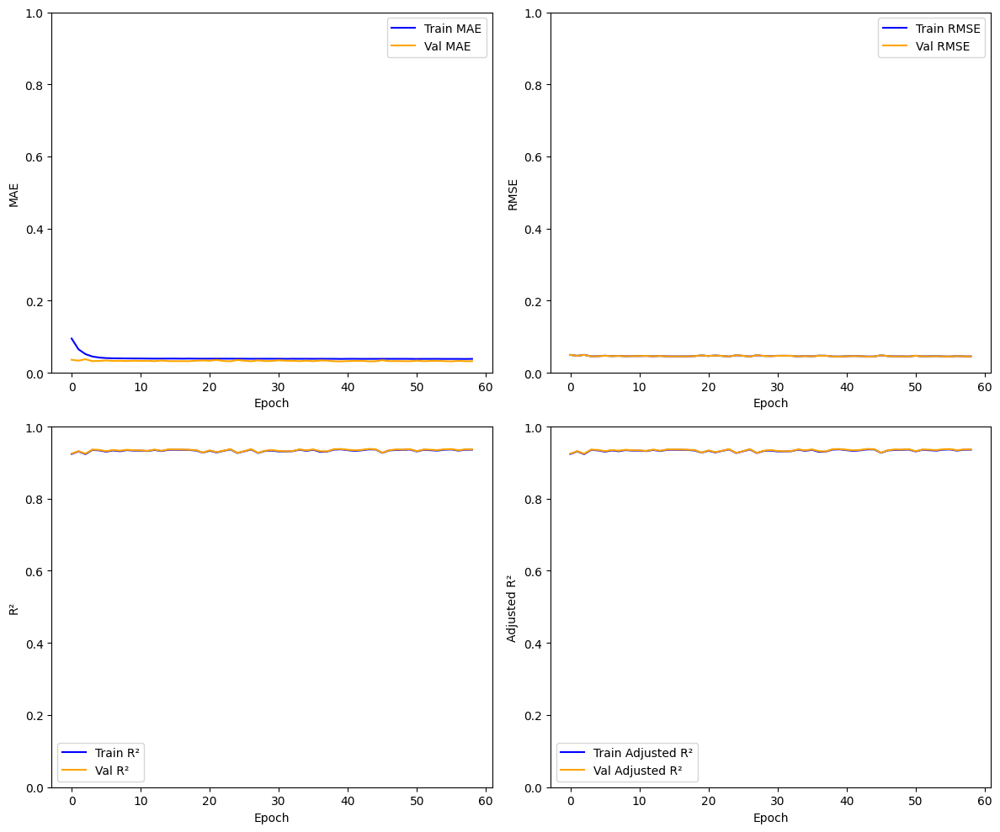

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history, metrics_callback):
    plt.figure(figsize=(12, 10))

    # Plot for Mean Absolute Error (MAE)
    plt.subplot(2, 2, 1)
    plt.plot(history['mean_absolute_error'], label='Train MAE', color='blue')
    plt.plot(history['val_mean_absolute_error'], label='Val MAE', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.ylim(0, 1)

    # Plot for Root Mean Square Error (RMSE)
    plt.subplot(2, 2, 2)
    plt.plot(metrics_callback.train_rmse, label='Train RMSE', color='blue')
    plt.plot(metrics_callback.val_rmse, label='Val RMSE', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.legend()
    plt.ylim(0, 1)

    # Plot for R²
    plt.subplot(2, 2, 3)
    plt.plot(metrics_callback.train_r2, label='Train R²', color='blue')
    plt.plot(metrics_callback.val_r2, label='Val R²', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('R²')
    plt.legend()
    plt.ylim(0, 1)

    # Plot for Adjusted R²
    plt.subplot(2, 2, 4)
    plt.plot(metrics_callback.train_adjusted_r2, label='Train Adjusted R²', color='blue')
    plt.plot(metrics_callback.val_adjusted_r2, label='Val Adjusted R²', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Adjusted R²')
    plt.legend()
    plt.ylim(0, 1)

    plt.tight_layout()
    plt.show()

# Plot training history
plot_training_history(history, metrics_callback)


## **Evaluation Metrics for 8 others weather stations data with Porpsed Attention-Based TCN Model**

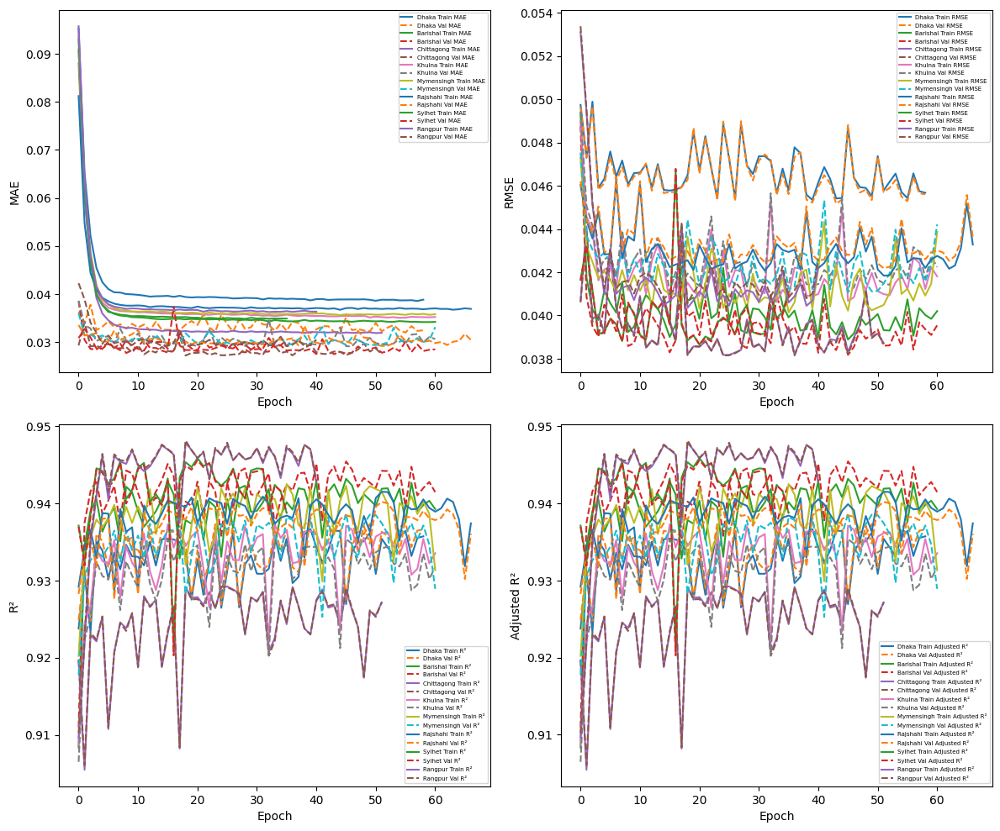

In [ ]:
import pickle
import matplotlib.pyplot as plt

# Function to load history and metrics callback
def load_metrics_and_history(station_names):
    station_histories = []
    station_callbacks = []

    for station_name in station_names:
        # Load history
        history_path = f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}/History/Version_2/history.pkl'
        with open(history_path, 'rb') as file:
            history = pickle.load(file)
            station_histories.append(history)

        # Load metrics callback
        metrics_callback_path = f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}/Metrics_Callback/Version_2/metrics_callback.pkl'
        with open(metrics_callback_path, 'rb') as file:
            metrics_callback = pickle.load(file)
            station_callbacks.append(metrics_callback)

    return station_histories, station_callbacks


# Function to plot training history for multiple stations
def plot_training_history_multiple_stations(station_histories, station_callbacks, station_names):
    plt.figure(figsize=(12, 10))

    # Plot Train and Validation MAE
    plt.subplot(2, 2, 1)
    for i, (history, station_name) in enumerate(zip(station_histories, station_names)):
        plt.plot(history['mean_absolute_error'], label=f'{station_name} Train MAE')
        plt.plot(history['val_mean_absolute_error'], label=f'{station_name} Val MAE', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend(fontsize=5)
    #plt.title('Train and Validation MAE')

    # Plot Train and Validation RMSE
    plt.subplot(2, 2, 2)
    for i, (metrics_callback, station_name) in enumerate(zip(station_callbacks, station_names)):
        plt.plot(metrics_callback.train_rmse, label=f'{station_name} Train RMSE')
        plt.plot(metrics_callback.val_rmse, label=f'{station_name} Val RMSE', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.legend(fontsize=5)
    #plt.title('Train and Validation RMSE')

    # Plot Train and Validation R²
    plt.subplot(2, 2, 3)
    for i, (metrics_callback, station_name) in enumerate(zip(station_callbacks, station_names)):
        plt.plot(metrics_callback.train_r2, label=f'{station_name} Train R²')
        plt.plot(metrics_callback.val_r2, label=f'{station_name} Val R²', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('R²')
    plt.legend(fontsize=5)
    #plt.title('Train and Validation R²')

    # Plot Train and Validation Adjusted R²
    plt.subplot(2, 2, 4)
    for i, (metrics_callback, station_name) in enumerate(zip(station_callbacks, station_names)):
        plt.plot(metrics_callback.train_adjusted_r2, label=f'{station_name} Train Adjusted R²')
        plt.plot(metrics_callback.val_adjusted_r2, label=f'{station_name} Val Adjusted R²', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('Adjusted R²')
    plt.legend(fontsize=5)
    #plt.title('Train and Validation Adjusted R²')

    # Adjust the layout and save the overall plot
    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/Thesis/DewPointTemperature/Training_History_All_Stations_Updated.pdf', dpi=300, bbox_inches='tight')
    plt.show()


# Function to plot training history for individual stations
def plot_training_history_individual_station(history, metrics_callback, station_name):
    plt.figure(figsize=(10, 8))

    # MAE
    plt.subplot(2, 2, 1)
    plt.plot(history['mean_absolute_error'], label='Train MAE')
    plt.plot(history['val_mean_absolute_error'], label='Val MAE', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    #plt.title(f'{station_name} MAE')

    # RMSE
    plt.subplot(2, 2, 2)
    plt.plot(metrics_callback.train_rmse, label='Train RMSE')
    plt.plot(metrics_callback.val_rmse, label='Val RMSE', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.legend()
    #plt.title(f'{station_name} RMSE')

    # R²
    plt.subplot(2, 2, 3)
    plt.plot(metrics_callback.train_r2, label='Train R²')
    plt.plot(metrics_callback.val_r2, label='Val R²', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('R²')
    plt.legend()
    #plt.title(f'{station_name} R²')

    # Adjusted R²
    plt.subplot(2, 2, 4)
    plt.plot(metrics_callback.train_adjusted_r2, label='Train Adjusted R²')
    plt.plot(metrics_callback.val_adjusted_r2, label='Val Adjusted R²', linestyle='dashed')
    plt.xlabel('Epoch')
    plt.ylabel('Adjusted R²')
    plt.legend()
    #plt.title(f'{station_name} Adjusted R²')

    # Save the plot for the station
    plt.tight_layout()
    plt.savefig(f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}_Training_History.pdf', dpi=300, bbox_inches='tight')
    plt.show()


# Load metrics and history for all stations
station_names = ['Dhaka', 'Barishal', 'Chittagong', 'Khulna', 'Mymensingh', 'Rajshahi', 'Sylhet', 'Rangpur']
station_histories, station_callbacks = load_metrics_and_history(station_names)

# Plot metrics for all stations in a combined plot
plot_training_history_multiple_stations(station_histories, station_callbacks, station_names)

# # Plot metrics for individual stations
# for station_name, history, metrics_callback in zip(station_names, station_histories, station_callbacks):
#     plot_training_history_individual_station(history, metrics_callback, station_name)


## **Model Evaluation**

In [ ]:
# Check the shape of the predictions
print("Shape of y_pred:", y_pred.shape)

# Flatten predictions if needed
y_pred_flat = y_pred.flatten()

# Check the shape of the predictions
print("Shape of y_pred:", y_pred_flat.shape)

Shape of y_pred: (25516, 1)
Shape of y_pred: (25516,)


In [ ]:
# Check the shape of actual values
print("Shape of y_test:", y_test.shape)

# Ensure both arrays have the same length
assert y_test.shape[0] == y_pred_flat.shape[0], "Mismatch in number of predictions"


Shape of y_test: (25516, 1)


In [ ]:
# Flatten y_test if needed
y_test_flat = y_test.flatten()

# Check the shape of flattened y_test
print("Shape of y_test_flat:", y_test_flat.shape)

Shape of y_test_flat: (25516,)


In [ ]:
# Ensure both arrays have the same length
assert y_test_flat.shape[0] == y_pred_flat.shape[0], "Mismatch in number of predictions"

In [ ]:
# Compare predictions with actual values
comparison_df = pd.DataFrame({"Actual": y_test_flat, "Predicted": y_pred_flat})
print(comparison_df.head(10))

     Actual  Predicted
0  0.093851   0.160503
1  0.579288   0.629358
2  0.708738   0.692064
3  0.611650   0.582989
4  0.514563   0.520371
5  0.644013   0.598018
6  0.805825   0.826161
7  0.902913   0.831235
8  0.789644   0.833582
9  0.255663   0.263182


In [ ]:
from sklearn.metrics import r2_score

# Calculate R-squared
r2 = r2_score(y_test_flat, y_pred_flat)

print(f"R-squared (R²): {r2:.4f}")


R-squared (R²): 0.9384


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate metrics
mae = mean_absolute_error(y_test_flat, y_pred_flat)
mse = mean_squared_error(y_test_flat, y_pred_flat)
rmse = mse**0.5

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

Mean Absolute Error (MAE): 0.0319
Mean Squared Error (MSE): 0.0020
Root Mean Squared Error (RMSE): 0.0449


## Actual Vs Predicted

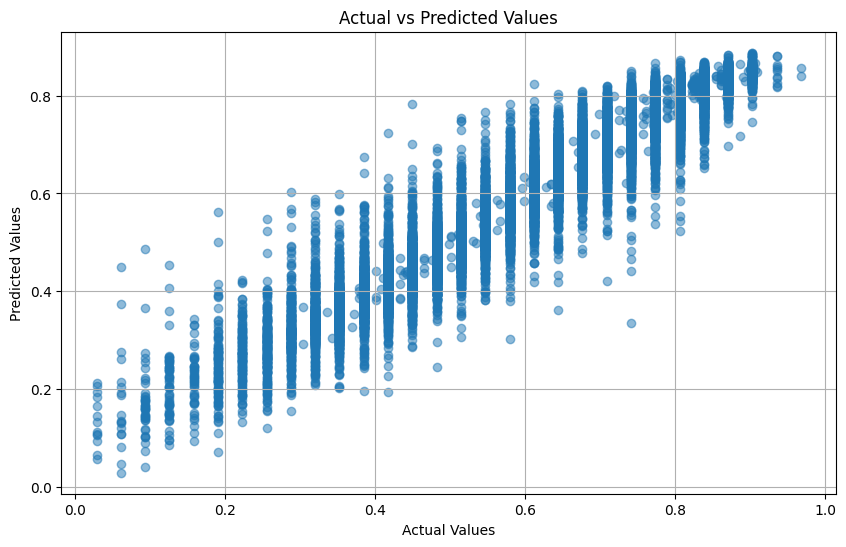

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_flat, y_pred_flat, alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values")
plt.grid(True)
plt.show()

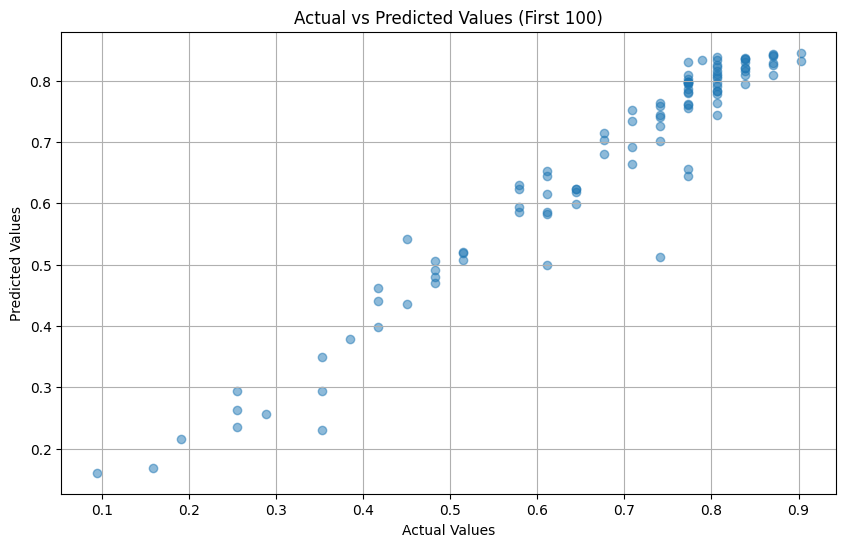

In [ ]:
# Select the first 100 values
n = 100
y_test_flat_subset = y_test_flat[:n]
y_pred_flat_subset = y_pred_flat[:n]

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test_flat_subset, y_pred_flat_subset, alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (First 100)")
plt.grid(True)
plt.show()


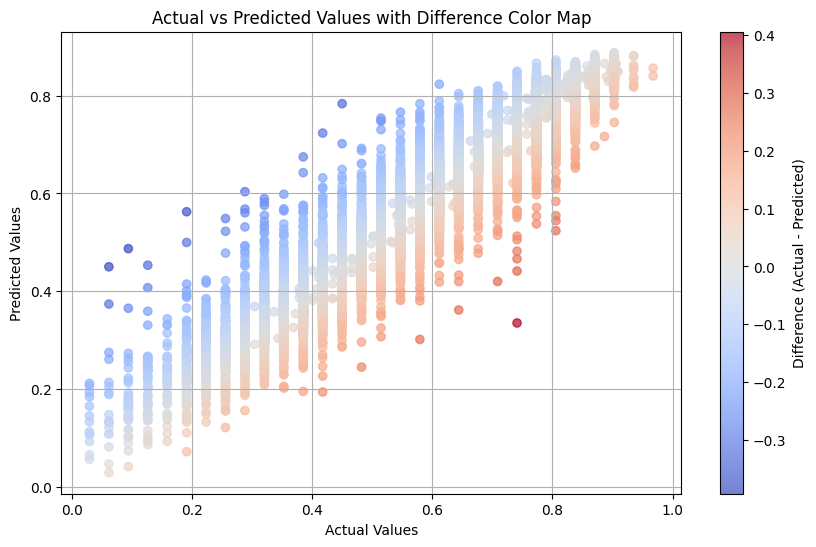

In [ ]:
# Calculate the difference between actual and predicted values
differences = y_test_flat - y_pred_flat

# Create a scatter plot with a color map
plt.figure(figsize=(10, 6))
scatter = plt.scatter(y_test_flat, y_pred_flat, c=differences, cmap='coolwarm', alpha=0.7)
plt.colorbar(scatter, label='Difference (Actual - Predicted)')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values with Difference Color Map")
plt.grid(True)
plt.show()


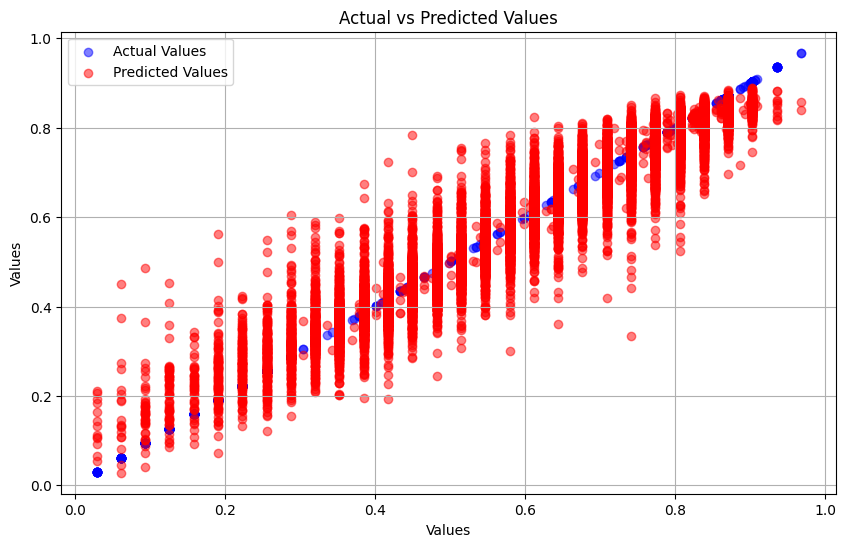

In [ ]:
plt.figure(figsize=(10, 6))

# Plot actual values
plt.scatter(y_test_flat, y_test_flat, color='blue', alpha=0.5, label='Actual Values')

# Plot predicted values
plt.scatter(y_test_flat, y_pred_flat, color='red', alpha=0.5, label='Predicted Values')

plt.xlabel("Values")
plt.ylabel("Values")
plt.title("Actual vs Predicted Values")
plt.legend()
plt.grid(True)
plt.show()


## **Actual vs Predicted Graph for 8 different weather stations**

798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
804/804 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
685/685 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
802/802 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step
748/748 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
801/801 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step
803/803 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step
798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
Figure saved successfully as PNG to /content/drive/MyDrive/Thesis/DewPointTemperature/Actual_vs_Predicted_All_Stations.png


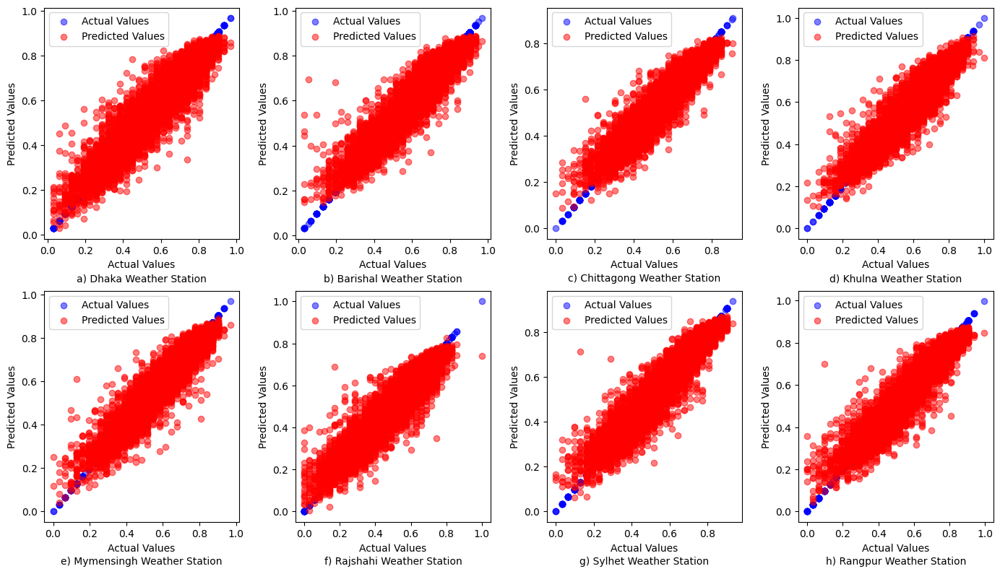

In [ ]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Function to load history and metrics callback
def load_metrics_and_history(station_names):
    station_histories = []
    station_callbacks = []

    for station_name in station_names:
        # Load history
        history_path = f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}/History/Version_1/history.pkl'
        with open(history_path, 'rb') as file:
            history = pickle.load(file)
            station_histories.append(history)

        # Load metrics callback
        metrics_callback_path = f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}/Metrics_Callback/Version_1/metrics_callback.pkl'
        with open(metrics_callback_path, 'rb') as file:
            metrics_callback = pickle.load(file)
            station_callbacks.append(metrics_callback)

    return station_histories, station_callbacks

# Function to load models dynamically for each station
def load_models(station_names):
    models = []
    for station_name in station_names:
        model_path = f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}/Model/Version_2/{station_name}_dew_point_model_best.keras'
        model = load_model(model_path)
        models.append(model)
    return models

# Function to load test data dynamically for each station
def load_test_data(station_names):
    x_test_list = []
    y_test_list = []

    for station_name in station_names:
        save_dir = f'/content/drive/MyDrive/Thesis/DewPointTemperature/{station_name}/Train_Test_Data/Version_2/'

        # Load X_test and y_test from .npy files
        x_test = np.load(os.path.join(save_dir, 'X_test.npy'))
        y_test = np.load(os.path.join(save_dir, 'y_test.npy'))

        x_test_list.append(x_test)
        y_test_list.append(y_test)

    return x_test_list, y_test_list

# Function to generate predictions
def generate_predictions(models, x_test_list, y_test_list):
    y_test_flat_list = []
    y_pred_flat_list = []

    for model, x_test, y_test in zip(models, x_test_list, y_test_list):
        # Generate predictions
        y_pred = model.predict(x_test)
        # Flatten both actual and predicted values
        y_test_flat = y_test.flatten()
        y_pred_flat = y_pred.flatten()

        y_test_flat_list.append(y_test_flat)
        y_pred_flat_list.append(y_pred_flat)

    return y_test_flat_list, y_pred_flat_list

# Function to plot actual vs predicted values for 8 weather stations
def plot_actual_vs_predicted_subplots(y_test_flat_list, y_pred_flat_list, station_names):
    plt.figure(figsize=(14, 8))

    for i, (y_test_flat, y_pred_flat, station_name) in enumerate(zip(y_test_flat_list, y_pred_flat_list, station_names)):
        ax = plt.subplot(2, 4, i + 1)
        ax.scatter(y_test_flat, y_test_flat, color='blue', alpha=0.5, label='Actual Values')
        ax.scatter(y_test_flat, y_pred_flat, color='red', alpha=0.5, label='Predicted Values')
        ax.set_xlabel("Actual Values")
        ax.set_ylabel("Predicted Values")
        #ax.set_title(f"{station_name} Weather Station")
        ax.legend()

        # Create dynamic label (starting from 'a')
        subfigure_label = chr(97 + i)  # 97 is the ASCII value for 'a'

        # Adding the dynamic subfigure label below the x-axis label
        ax.text(0.5, -0.15, f"{subfigure_label}) {station_name} Weather Station", transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='center', color='black')

    plt.tight_layout()
    output_dir = '/content/drive/MyDrive/Thesis/DewPointTemperature/'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Save the figure as PNG
    png_file = os.path.join(output_dir, 'Actual_vs_Predicted_All_Stations.png')
    try:
        plt.savefig(png_file, dpi=300, bbox_inches='tight', format='png')
        print(f"Figure saved successfully as PNG to {png_file}")
    except Exception as e:
        print(f"Error saving PNG figure: {e}")

    # Show the plot
    plt.show()



# Define station names
station_names = ['Dhaka', 'Barishal', 'Chittagong', 'Khulna', 'Mymensingh', 'Rajshahi', 'Sylhet', 'Rangpur']

# Load models, metrics, and history
models = load_models(station_names)
station_histories, station_callbacks = load_metrics_and_history(station_names)

# Load test data for each station
x_test_list, y_test_list = load_test_data(station_names)

# Generate predictions
y_test_flat_list, y_pred_flat_list = generate_predictions(models, x_test_list, y_test_list)

# Plot results
plot_actual_vs_predicted_subplots(y_test_flat_list, y_pred_flat_list, station_names)


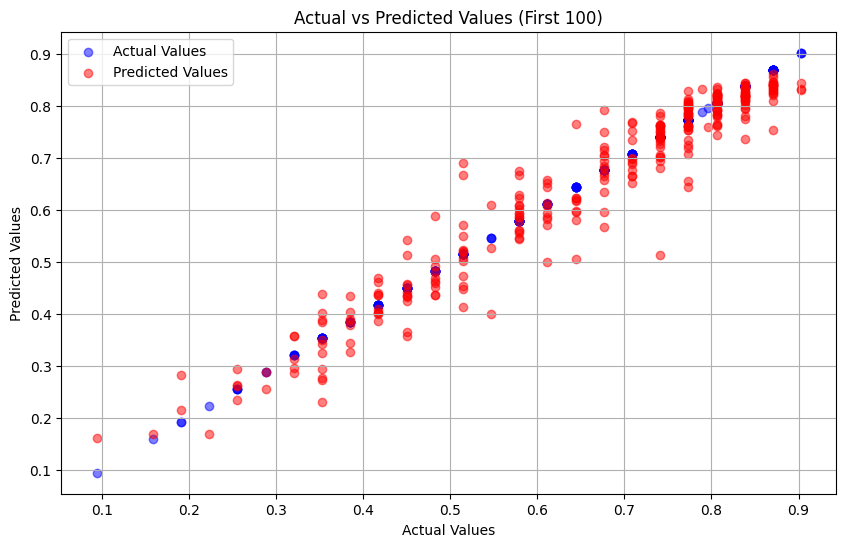

In [ ]:
# Select the first 100 values
n = 300
y_test_flat_subset = y_test_flat[:n]
y_pred_flat_subset = y_pred_flat[:n]

plt.figure(figsize=(10, 6))

# Plot actual values
plt.scatter(y_test_flat_subset, y_test_flat_subset, color='blue', alpha=0.5, label='Actual Values')

# Plot predicted values
plt.scatter(y_test_flat_subset, y_pred_flat_subset, color='red', alpha=0.5, label='Predicted Values')

plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (First 100)")
plt.legend()
plt.grid(True)
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


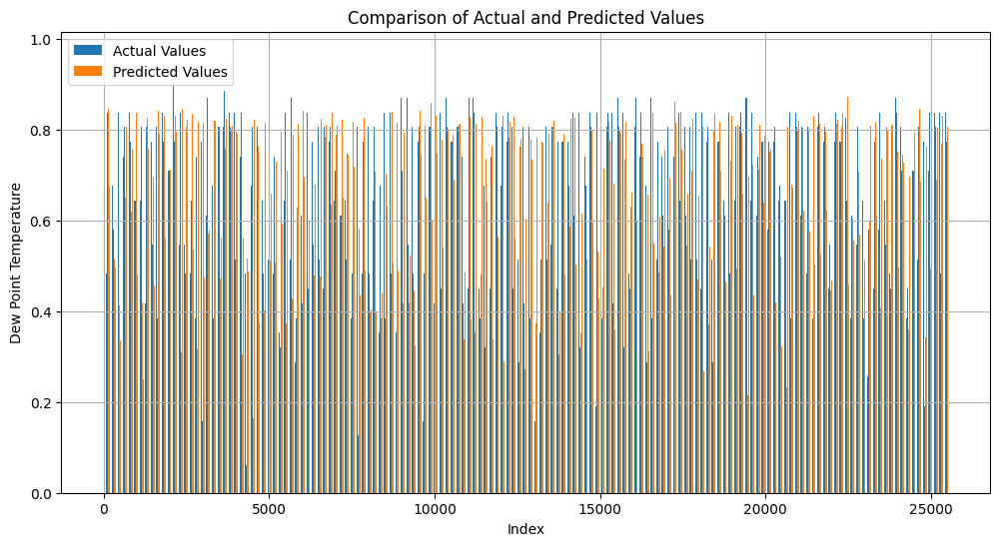

In [ ]:
x = np.arange(len(y_test_flat))
width = 0.35  # the width of the bars

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, y_test_flat, width, label='Actual Values')
plt.bar(x + width/2, y_pred_flat, width, label='Predicted Values')

plt.xlabel("Index")
plt.ylabel("Dew Point Temperature")
plt.title("Comparison of Actual and Predicted Values")
plt.legend()
plt.grid(True)
plt.show()


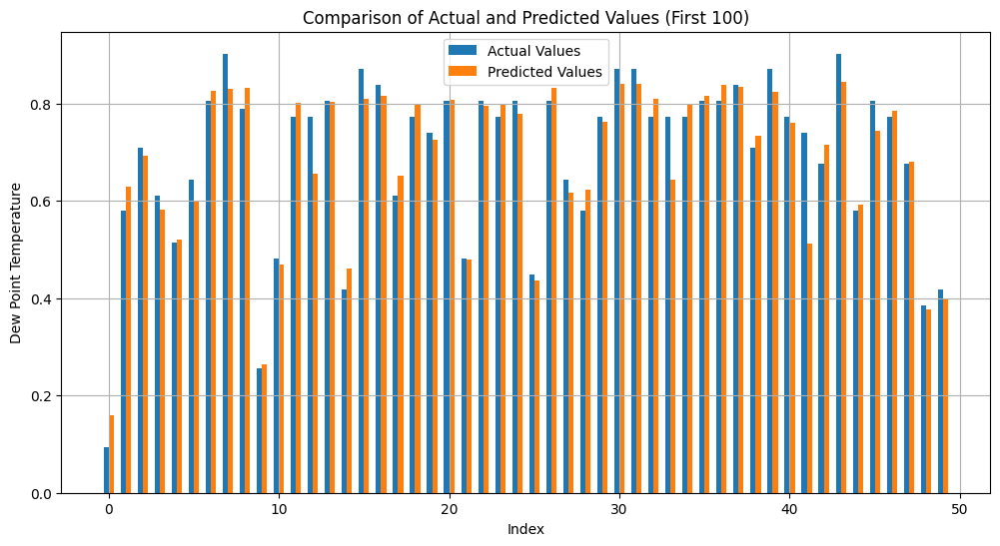

In [ ]:
# Number of samples to display
n = 50

# Subset of the first 100 actual and predicted values
x = np.arange(n)
y_test_flat_subset = y_test_flat[:n]
y_pred_flat_subset = y_pred_flat[:n]

width = 0.3  # the width of the bars

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, y_test_flat_subset, width, label='Actual Values')
plt.bar(x + width/2, y_pred_flat_subset, width, label='Predicted Values')

plt.xlabel("Index")
plt.ylabel("Dew Point Temperature")
plt.title("Comparison of Actual and Predicted Values (First 100)")
plt.legend()
plt.grid(True)
plt.show()


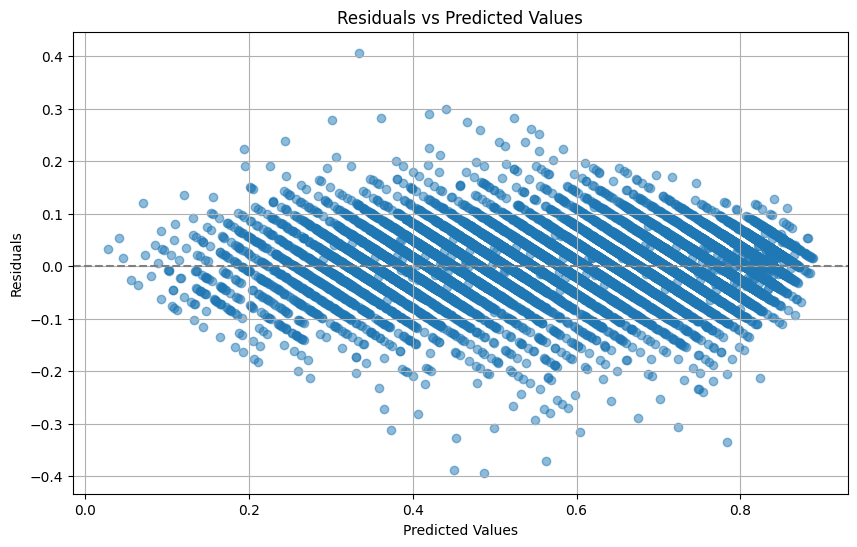

In [ ]:
# Assuming y_test_flat and y_pred_flat are your actual and predicted values respectively
residuals = y_test_flat - y_pred_flat

plt.figure(figsize=(10, 6))
plt.scatter(y_pred_flat, residuals, alpha=0.5)
plt.axhline(y=0, color='gray', linestyle='--')
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted Values")
plt.grid(True)
plt.show()


In [ ]:
mean_residual = np.mean(residuals)
std_residual = np.std(residuals)

print(f"Mean of Residuals: {mean_residual:.4f}")
print(f"Standard Deviation of Residuals: {std_residual:.4f}")


Mean of Residuals: 0.0032
Standard Deviation of Residuals: 0.0448


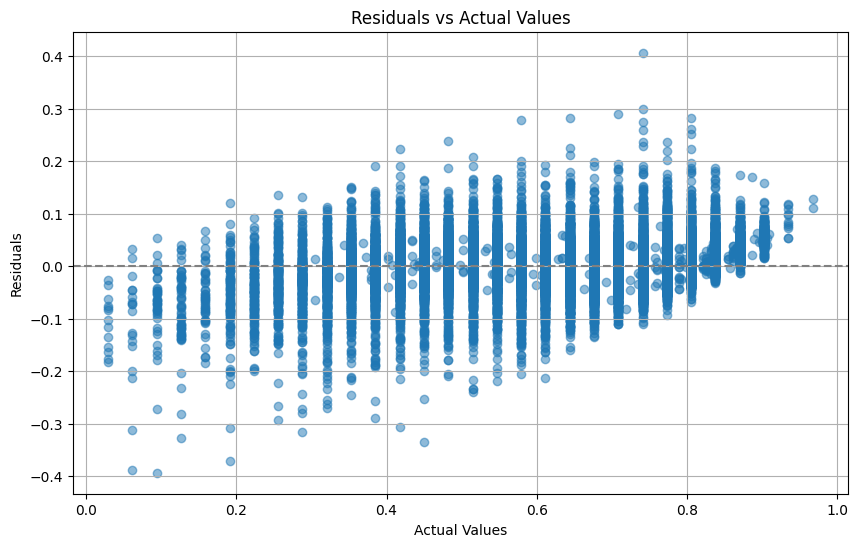

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test_flat, residuals, alpha=0.5)
plt.axhline(y=0, color='gray', linestyle='--')
plt.xlabel("Actual Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Actual Values")
plt.grid(True)
plt.show()


In [ ]:
# Calculate and print summary statistics for residuals
mean_residual = np.mean(residuals)
std_residual = np.std(residuals)
skewness = stats.skew(residuals)
kurtosis = stats.kurtosis(residuals)

print(f"Mean of Residuals: {mean_residual:.4f}")
print(f"Standard Deviation of Residuals: {std_residual:.4f}")
print(f"Skewness of Residuals: {skewness:.4f}")
print(f"Kurtosis of Residuals: {kurtosis:.4f}")


Mean of Residuals: 0.0032
Standard Deviation of Residuals: 0.0448
Skewness of Residuals: -0.4418
Kurtosis of Residuals: 4.9380


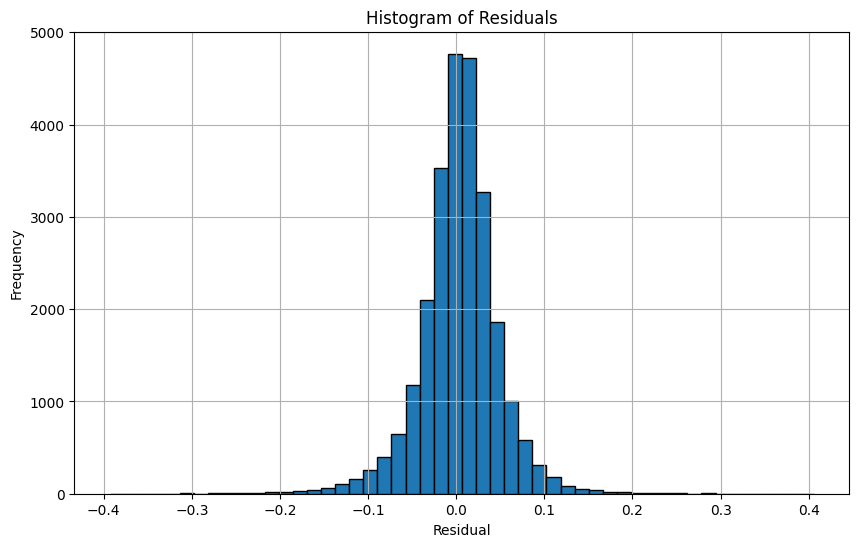

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=50, edgecolor='black')
plt.xlabel("Residual")
plt.ylabel("Frequency")
plt.title("Histogram of Residuals")
plt.grid(True)
plt.show()

In [ ]:
correlation = np.corrcoef(y_test_flat, y_pred_flat)[0, 1]
print(f"Correlation coefficient: {correlation:.4f}")

Correlation coefficient: 0.9689


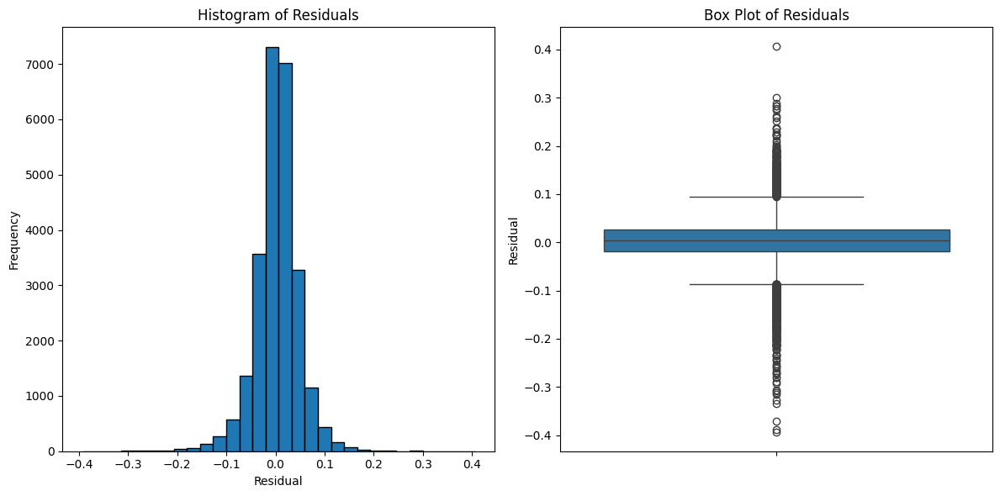

In [ ]:
import seaborn as sns
# Histogram of residuals
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(residuals, bins=30, edgecolor='k')
plt.title('Histogram of Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.xticks()


# Box plot of residuals
plt.subplot(1, 2, 2)
sns.boxplot(y=residuals)
plt.title('Box Plot of Residuals')
plt.ylabel('Residual')
plt.xticks()

plt.tight_layout()
plt.show()


In [ ]:
# Calculate the absolute errors
errors = np.abs(y_test_flat - y_pred_flat)

# Find indices where the error is less than 0.02
indices_less_than_0_02 = np.where(errors < 0.02)[0]

# Get the actual and predicted values for these indices
actual_values_less_than_0_02 = y_test_flat[indices_less_than_0_02]
predicted_values_less_than_0_02 = y_pred_flat[indices_less_than_0_02]

# Print out the number of such instances
print(f"Number of data points with error less than 0.02: {len(indices_less_than_0_02)}")

# Optionally, display some of these values
print("Some actual values with error less than 0.02:", actual_values_less_than_0_02[:10])
print("Some predicted values with error less than 0.02:", predicted_values_less_than_0_02[:10])


Number of data points with error less than 0.02: 11349
Some actual values with error less than 0.02: [0.70873786 0.51456311 0.25566343 0.48220065 0.80582524 0.74110032
 0.80582524 0.48220065 0.80582524 0.44983819]
Some predicted values with error less than 0.02: [0.6920644  0.52037096 0.26318216 0.46981147 0.803516   0.72639775
 0.80710757 0.48046643 0.79520553 0.43642837]


In [ ]:
# Calculate the absolute errors
errors = np.abs(y_test_flat - y_pred_flat)

# Define the bins
bins = [0, 0.05, 0.1, 0.15, 0.2]
bin_labels = ['0 to 0.05', '0.05 to 0.1', '0.1 to 0.15', '0.15 to 0.2']

# Calculate histogram counts for each bin
counts, _ = np.histogram(errors, bins=bins)

# Display the counts for each bin
for label, count in zip(bin_labels, counts):
    print(f"Count of data points with error in range {label}: {count}")


Count of data points with error in range 0 to 0.05: 20552
Count of data points with error in range 0.05 to 0.1: 3961
Count of data points with error in range 0.1 to 0.15: 759
Count of data points with error in range 0.15 to 0.2: 172


In [ ]:
# Calculate the absolute errors
errors = np.abs(y_test_flat - y_pred_flat)

# Define the bins and bin labels
bins = [0, 0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2]
bin_labels = ['0 to 0.02', '0.02 to 0.04', '0.04 to 0.06', '0.06 to 0.08',
              '0.08 to 0.1', '0.1 to 0.12', '0.12 to 0.14', '0.14 to 0.16',
              '0.16 to 0.18', '0.18 to 0.2']

# Calculate histogram counts for each bin
counts, _ = np.histogram(errors, bins=bins)

# Display the counts for each bin
for label, count in zip(bin_labels, counts):
    print(f"Count of data points with error in range {label}: {count}")


Count of data points with error in range 0 to 0.02: 11349
Count of data points with error in range 0.02 to 0.04: 7099
Count of data points with error in range 0.04 to 0.06: 3567
Count of data points with error in range 0.06 to 0.08: 1635
Count of data points with error in range 0.08 to 0.1: 863
Count of data points with error in range 0.1 to 0.12: 463
Count of data points with error in range 0.12 to 0.14: 219
Count of data points with error in range 0.14 to 0.16: 124
Count of data points with error in range 0.16 to 0.18: 77
Count of data points with error in range 0.18 to 0.2: 48


## **Saving the Actual vs Predicted Data**

In [ ]:
features.columns

Index(['Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
       'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer',
       'Season_Winter', 'Trend'],
      dtype='object')

### **Prediction Error Greater than 0.5**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))

# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 0.5
indices_high_error = np.where(errors > 0.5)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2/Prediction_Error_Greater_Than_0.5.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


 35/798 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (16025, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2/Prediction_Error_Greater_Than_0.5.xlsx.


### **Prediction Error Greater than 1**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))

# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 1
indices_high_error = np.where(errors > 1)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2/Prediction_Error_Greater_Than_1.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


 16/798 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step    

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (9301, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2/Prediction_Error_Greater_Than_1.xlsx.


### **Prediction Error Greater than 1.5**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))

# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 1.5
indices_high_error = np.where(errors > 1.5)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2//Prediction_Error_Greater_Than_1.5.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


 29/798 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (5224, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2//Prediction_Error_Greater_Than_1.5.xlsx.


### **Prediction Error Greater than 2**

In [ ]:
import numpy as np
import pandas as pd
import joblib
import os

# Define feature names based on your dataset
feature_names = [
    'Year', 'Month_sin', 'Month_cos', 'DayOfYear', 'Time_sin', 'Time_cos',
    'DayOrNight_Day', 'DayOrNight_Night', 'Season_Rainy', 'Season_Summer', 'Season_Winter','Trend']


best_model =load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_target_scaler.pkl')

# Load the scaled data
scaled_data_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Train_Test_Data/Version_2/'
X_test_scaled = np.load(os.path.join(scaled_data_path, 'X_test.npy'))
y_test_scaled = np.load(os.path.join(scaled_data_path, 'y_test.npy'))
# Apply inverse transformation to get original data
X_test_original = feature_scaler.inverse_transform(X_test_scaled.reshape(-1, X_test_scaled.shape[-1])).reshape(X_test_scaled.shape)
y_test_original = target_scaler.inverse_transform(y_test_scaled.reshape(-1, 1))

# Calculate predictions and errors
y_pred_scaled = best_model.predict(X_test_scaled)
y_pred_original = target_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
errors = np.abs(y_test_original - y_pred_original)

# Find indices where the error is greater than 2
indices_high_error = np.where(errors > 2)[0]

# Extract high error data
X_test_high_error = X_test_original[indices_high_error]
y_test_high_error = y_test_original[indices_high_error]
y_pred_high_error = y_pred_original[indices_high_error]

# Verify the shape and columns of X_test_high_error
print("Shape of X_test_high_error:", X_test_high_error.shape)

# Create DataFrame for high error data
df_high_error = pd.DataFrame(X_test_high_error.reshape(-1, X_test_high_error.shape[-1]), columns=feature_names)

# Add original Year and DayOfYear columns
# Ensure the columns are present and correctly indexed
df_high_error['Original_Year'] = df_high_error['Year'] + df_dew['Year'].min()
df_high_error['Original_DayOfYear'] = df_high_error['DayOfYear']

# Add actual, predicted, and error columns
df_high_error['Actual'] = y_test_high_error.flatten()
df_high_error['Predicted'] = y_pred_high_error.flatten()
df_high_error['Error'] = errors[indices_high_error].flatten()

# Save to Excel
excel_save_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2/Prediction_Error_Greater_Than_2.xlsx'
os.makedirs(os.path.dirname(excel_save_path), exist_ok = True)

df_high_error.to_excel(excel_save_path, index=False)

print(f"High error data saved to {excel_save_path}.")


 11/798 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step    

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


798/798 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Shape of X_test_high_error: (2998, 1, 12)
High error data saved to /content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Actual_Vs_Predicted/Version_2/Prediction_Error_Greater_Than_2.xlsx.


## **Making a prediction with new data**

## Trend Calculation

In [ ]:
import pandas as pd
import numpy as np

def get_trend_moving_average(future_year, future_month, future_day, future_time, df_dew):
    # Filter the historical data based on the specified month, day, and time
    historical_data = df_dew[(df_dew['Month'] == future_month) & (df_dew['Day'] == future_day) & (df_dew['Time'] == future_time)]

    # Capture only 'Year' and 'Trend' columns
    historical_data = historical_data[['Year', 'Trend']]

    if historical_data.empty:
        return np.nan

    # Calculate the change in trend for future predictions
    historical_data['Trend_Change'] = historical_data['Trend'].diff()

    # Calculate average change, excluding NaN values
    average_change = np.round(historical_data['Trend_Change'].mean(), decimals=10)  # Control precision

    # # Debug: Print average change to check if it's consistent
    # print(f"Calculated average change: {average_change}")

    # Get the last trend from the historical data
    last_trend = historical_data[historical_data['Year'] == historical_data['Year'].max()]['Trend'].values[0]

    # Normalize the future year
    normalized_future_year = future_year - 1980

    # Calculate the difference in years
    current_year_normalized = historical_data['Year'].max()
    year_difference = normalized_future_year - current_year_normalized

    # Incrementally calculate the trend for the future year
    future_trend = last_trend + (year_difference * average_change)  # Increment by the average change multiplied by year difference

    return future_trend

# Example usage:
future_year = 2024
future_month = 7
future_day = 1
future_time = 18

trend_value = get_trend_moving_average(future_year, future_month, future_day, future_time, df_dew)

print(f"Trend: {trend_value}")


Trend: 25.3386627907


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from tensorflow.keras.models import load_model
import joblib

def get_season(month, day):
    if (month == 11) or (month == 12) or (month == 1) or (month == 2):
        return 'Winter'
    elif (month >= 3 and month <= 6):
        return 'Summer'
    elif (month >= 7 and month <= 10):
        return 'Rainy'
    return 'Unknown'

def day_or_night(hour):
    return 'Day' if 6 <= hour < 18 else 'Night'

def get_trend_moving_average(future_year, future_month, future_day, future_time, df_dew):
    # Filter the historical data based on the specified month, day, and time
    historical_data = df_dew[(df_dew['Month'] == future_month) & (df_dew['Day'] == future_day) & (df_dew['Time'] == future_time)]

    # Capture only 'Year' and 'Trend' columns
    historical_data = historical_data[['Year', 'Trend']]

    if historical_data.empty:
        return np.nan

    # Calculate the change in trend for future predictions
    historical_data['Trend_Change'] = historical_data['Trend'].diff()

    # Calculate average change, excluding NaN values
    average_change = np.round(historical_data['Trend_Change'].mean(), decimals=10)  # Control precision

    # # Debug: Print average change to check if it's consistent
    # print(f"Calculated average change: {average_change}")

    # Get the last trend from the historical data
    last_trend = historical_data[historical_data['Year'] == historical_data['Year'].max()]['Trend'].values[0]

    # Normalize the future year
    normalized_future_year = future_year - 1980

    # Calculate the difference in years
    current_year_normalized = historical_data['Year'].max()
    year_difference = normalized_future_year - current_year_normalized

    # Incrementally calculate the trend for the future year
    future_trend = last_trend + (year_difference * average_change)  # Increment by the average change multiplied by year difference

    return future_trend

def prepare_future_data(year, month, day, time, df):
    # Get season
    season = get_season(month, day)

    # One-hot encoding for seasons
    seasons = ['Winter', 'Summer', 'Rainy']
    season_one_hot = {f'Season_{s}': 0 for s in seasons}
    season_one_hot[f'Season_{season}'] = 1

    # Convert to DataFrame
    season_df = pd.DataFrame([season_one_hot])

    # Define the future date
    future_date = datetime(year=year, month=month, day=day)
    future_day_of_year = future_date.timetuple().tm_yday

    # Cyclical encoding
    future_month_sin = np.sin(2 * np.pi * month / 12)
    future_month_cos = np.cos(2 * np.pi * month / 12)
    future_time_sin = np.sin(2 * np.pi * time / 24)
    future_time_cos = np.cos(2 * np.pi * time / 24)

    # Determine day or night
    day_night = day_or_night(time)
    day_night_one_hot = {
        'DayOrNight_Day': 1 if day_night == 'Day' else 0,
        'DayOrNight_Night': 1 if day_night == 'Night' else 0
    }

    # Convert to DataFrame
    day_night_df = pd.DataFrame([day_night_one_hot])

    # Calculate trend and humidity
    trend_value = get_trend_moving_average(year, month, day, time, df_dew)
    # Create the future_data DataFrame with ordered features
    future_data = pd.DataFrame({
        'Year': [year - 1980],  # Normalize year relative to your dataset
        'Month_sin': [future_month_sin],
        'Month_cos': [future_month_cos],
        'DayOfYear': [future_day_of_year],
        'Time_sin': [future_time_sin],
        'Time_cos': [future_time_cos],
        'DayOrNight_Day': [day_night_one_hot['DayOrNight_Day']],
        'DayOrNight_Night': [day_night_one_hot['DayOrNight_Night']],
        'Season_Rainy': [season_one_hot['Season_Rainy']],
        'Season_Summer': [season_one_hot['Season_Summer']],
        'Season_Winter': [season_one_hot['Season_Winter']],
        'Trend': [trend_value],
    })
    return future_data

# Load your scalers and model
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_target_scaler.pkl')

model_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras'
model = load_model(model_path)

# Example usage
year = 2030
month = 5
day = 1
time = 15  # Time in hours

# Prepare future data for prediction
df_year = pd.DataFrame({'Year': list(range(1980, 2024))})  # Historical year data

# Add your historical data to df_year for trend and humidity calculations
df_year = pd.concat([df_year, df_dew[['Year']]], ignore_index=True)

# Prepare future data for prediction
future_data = prepare_future_data(year, month, day, time, df_year)

# Scale the future data
future_data_scaled = feature_scaler.transform(future_data)

# Reshape the data to match the model input shape
future_data_scaled = future_data_scaled.reshape((1, 1, future_data_scaled.shape[1]))

# Make a prediction
prediction_scaled = model.predict(future_data_scaled)

# Inverse transform the prediction
prediction = target_scaler.inverse_transform(prediction_scaled)

# Display the prediction
print(f"Predicted Dew Point Temperature: {prediction[0][0]}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (1, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


Predicted Dew Point Temperature: 19.160749435424805


## **Saving the Final Model For Nectron Visualization**

In [ ]:
# Load the trained model
model_load_path = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras'
best_model = tf.keras.models.load_model(model_load_path)


In [ ]:
# Save the model as an HDF5 (.h5) file
best_model.save('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.h5')


## **Model Visualizaions**

In [ ]:
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')
best_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1, 12)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d (Conv1D)           │ (None, 1, 192)         │          4,800 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_1 (Conv1D)         │ (None, 1, 192)         │         73,920 │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 1, 192)         │              0 │ conv1d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 1, 192)         │              0 │ dropout[0][0],         │
│                           │                        │                │ conv1d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_2 (Conv1D)         │ (None, 1, 192)         │         73,920 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 1, 192)         │              0 │ conv1d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (None, 1, 192)         │              0 │ dropout_1[0][0],       │
│                           │                        │                │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (None, 1, 192)         │        148,224 │ add_1[0][0],           │
│ (MultiHeadAttention)      │                        │                │ add_1[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 1, 192)         │              0 │ multi_head_attention[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 1, 192)         │              0 │ add_1[0][0],           │
│                           │                        │                │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 192)            │              0 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │         12,352 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 64)             │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │             65 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 939,845 (3.59 MB)

 Trainable params: 313,281 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 626,564 (2.39 MB)

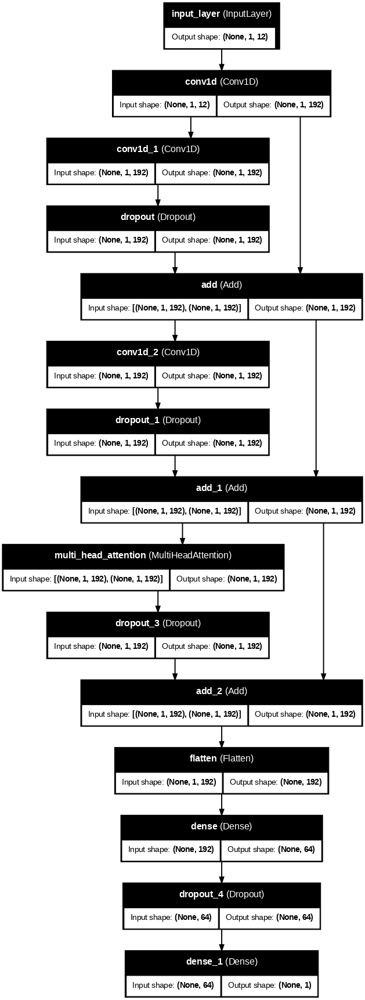

In [ ]:
# Load your best model
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# # Generate the model summary
# best_model.summary()

# Visualize and save the model structure
plot_model(best_model, to_file='model_structure.png', show_shapes=True, show_layer_names=True, dpi=70)


In [ ]:
# Load your best model
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Visualize and save the model structure as a PDF
plot_model(best_model, to_file='model_structure.pdf', show_shapes=True, show_layer_names=True, dpi=70)


In [ ]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load your best model
best_model = tf.keras.models.load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Save the model structure as a PNG first
plot_model(best_model, to_file='model_structure_temp.png', show_shapes=True, show_layer_names=True, dpi=70)

# Load the saved PNG image
img = mpimg.imread('model_structure_temp.png')

# Create a new figure with reduced size
plt.figure(figsize=(20, 7))  # Adjust the size as needed
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.savefig('model_structure.pdf', bbox_inches='tight', pad_inches=0.1)  # Save as PDF
plt.close()


/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


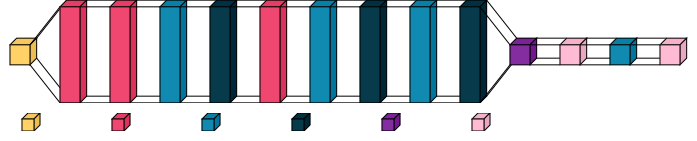

In [ ]:
# Load your best model
best_model = load_model('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Model/Version_2/Dhaka_dew_point_model_best.keras')

# Adjust the layer types to ignore complex ones like MultiHeadAttention
# Specify which layers to ignore (e.g., attention layers)
visualkeras.layered_view(
    best_model,
    legend=True,
    scale_xy=0.5,
    spacing=30,
    type_ignore=[tf.keras.layers.MultiHeadAttention]  # Ignore the MultiHeadAttention layer
)


## **Loading Tensorboard Log**

In [ ]:
# Load TensorBoard extension in Colab (or Jupyter Notebook)
%load_ext tensorboard

# Start TensorBoard and point it to your log directory
%tensorboard --logdir '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/TensorBoard/Version_2/'


<IPython.core.display.Javascript object>

# **Model Interpretation Using Explainable AI(LIME and SHAP)**

## **Feature Importance for Dew Point Temperature Prediction Using LIME**

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━

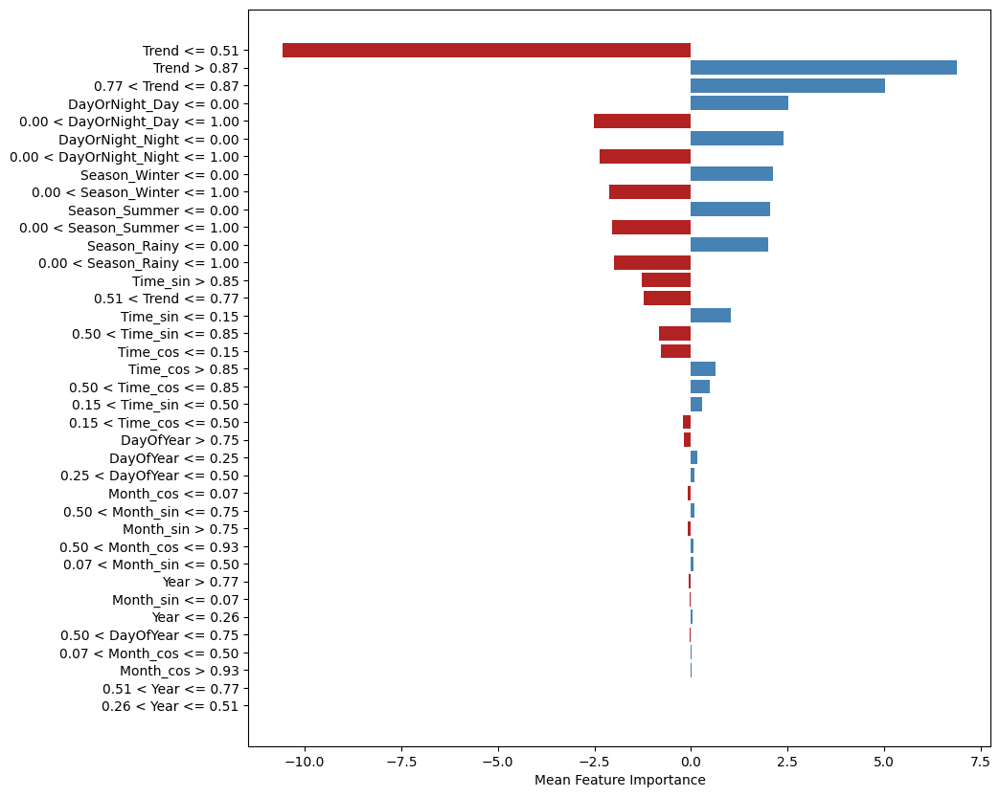

In [ ]:
# Define the prediction function
def predict_fn(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))  # Reshape for LSTM input
    predictions = best_model.predict(X)
    return Dhaka_dew_point_target_scaler.inverse_transform(predictions).flatten()  # Inverse transform to original scale

# Load the saved scalers
feature_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_feature_scaler.pkl')
target_scaler = joblib.load('/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/Dhaka_dew_point_target_scaler.pkl')

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=features_scaled,
    feature_names=features,
    mode='regression',  # For regression tasks
)

# Define the number of instances to sample
num_samples = 2000  # You can increase or decrease based on your needs
sample_indices = random.sample(range(len(X_test)), num_samples)

# Dictionary to hold aggregated feature importance
global_feature_importance = {}

# Generate explanations for the selected sample
for i in sample_indices:
    instance = X_test[i]
    explanation = explainer.explain_instance(
        instance.flatten(),  # Flatten for the explainer
        predict_fn,
        num_features=len(features)
    )

    # Extract feature importances from the explanation
    feature_importances = dict(explanation.as_list())

    # Aggregate feature importance scores
    for feature, importance in feature_importances.items():
        if feature not in global_feature_importance:
            global_feature_importance[feature] = []
        global_feature_importance[feature].append(importance)

# Calculate mean importance for each feature
mean_feature_importance = {feature: np.mean(importances) for feature, importances in global_feature_importance.items()}

# Sort features by mean importance
sorted_features = sorted(mean_feature_importance.items(), key=lambda x: abs(x[1]), reverse=True)

# Plot global feature importances
feature_names, feature_values = zip(*sorted_features)
plt.figure(figsize=(10, 10))
plt.barh(feature_names, feature_values, color=['steelblue' if value > 0 else 'firebrick' for value in feature_values])
plt.xlabel('Mean Feature Importance')
#plt.title('Global Feature Importance using LIME')
plt.gca().invert_yaxis()

plt.savefig('/content/drive/MyDrive/Thesis/DewPointTemperature/LIME_Global_Feature_Importance_Updated.pdf', dpi=300, bbox_inches='tight')
plt.show()


## **Global Importance Features Using SHAP**

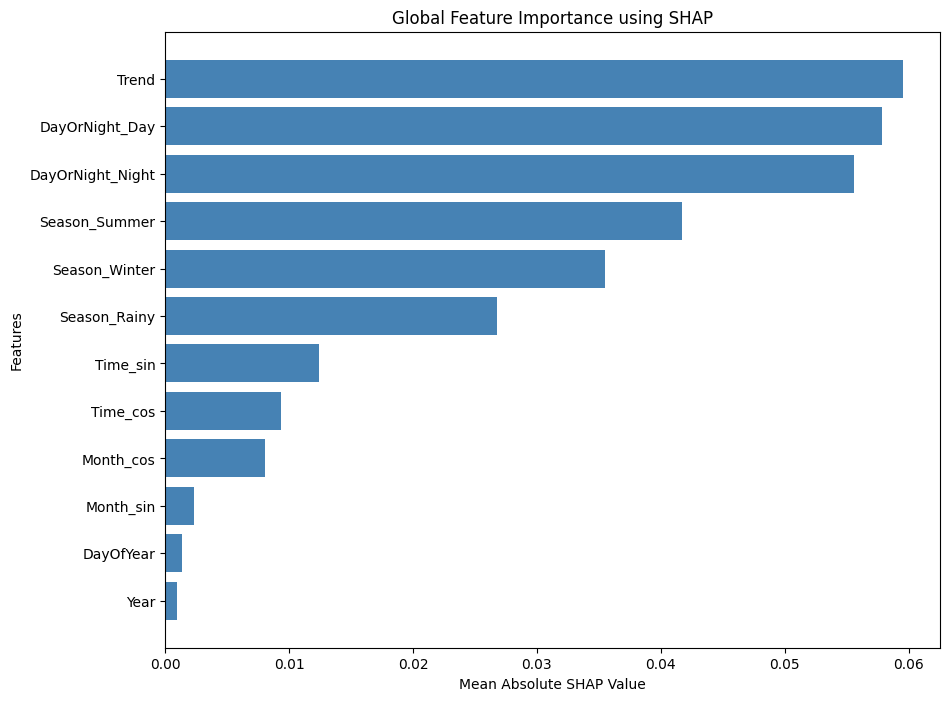

In [ ]:
# Plot global feature importance
plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Mean Absolute SHAP Value'], color='steelblue')
plt.xlabel('Mean Absolute SHAP Value')
plt.ylabel('Features')
plt.title('Global Feature Importance using SHAP')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()


## **Interpreting Single Predictions using LIME**

Feature scaler loaded from /content/drive/MyDrive/Dhaka Dew Point Temperature Prediction/Prediction Model/Deep Learning Model/TCN/Scaler/Version_10/Dhaka_dew_point_feature_scaler.pkl
Target scaler loaded from /content/drive/MyDrive/Dhaka Dew Point Temperature Prediction/Prediction Model/Deep Learning Model/TCN/Scaler/Version_10/Dhaka_dew_point_target_scaler.pkl


/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (32, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


151/157 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

/usr/local/lib/python3.10/dist-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis 3 of a tensor of shape (None, 4, 1, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


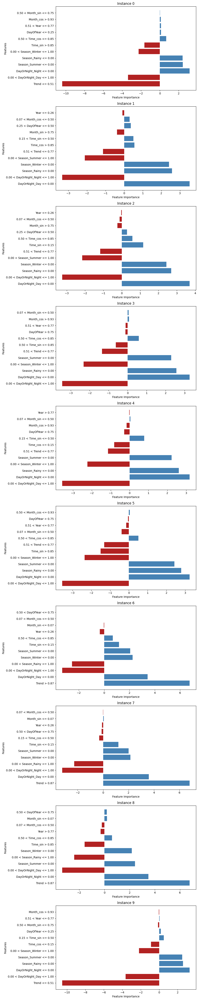

In [ ]:
# Define the directory containing the saved scalers
directory = '/content/drive/MyDrive/Thesis/DewPointTemperature/Dhaka/Scaler/Version_2/'

# Load the feature and target scalers
feature_scaler_path = os.path.join(directory, 'Dhaka_dew_point_feature_scaler.pkl')
target_scaler_path = os.path.join(directory, 'Dhaka_dew_point_target_scaler.pkl')

Dhaka_dew_point_feature_scaler = joblib.load(feature_scaler_path)
Dhaka_dew_point_target_scaler = joblib.load(target_scaler_path)

print(f"Feature scaler loaded from {feature_scaler_path}")
print(f"Target scaler loaded from {target_scaler_path}")

# Define the prediction function
def predict_fn(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))  # Reshape for LSTM input
    predictions = best_model.predict(X)
    return Dhaka_dew_point_target_scaler.inverse_transform(predictions).flatten()  # Inverse transform to original scale

# Assume `features_scaled` is the scaled version of the feature data used for LIME
# Example: features_scaled = Dhaka_dew_point_feature_scaler.transform(features_df)

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=features_scaled,
    feature_names=features,  # Ensure features are correctly named
    mode='regression',  # For regression tasks
    training_labels=target_scaled.flatten()
)

# Number of instances to plot
num_instances = min(len(X_test), 10)  # Adjust as needed

# Create a figure with the exact number of subplots needed
fig, axes = plt.subplots(num_instances, 1, figsize=(10, 5 * num_instances), squeeze=False)

# Iterate through selected test instances
for i in range(num_instances):
    instance = X_test[i]  # Get instance
    explanation = explainer.explain_instance(
        instance.flatten(),  # Flatten for the explainer
        predict_fn,
        num_features=len(features)
    )

    # Plot explanation
    feature_importances = explanation.as_list()
    feature_names, feature_weights = zip(*feature_importances)

    # Create bar plot for feature importances
    axes[i, 0].barh(feature_names, feature_weights, color=['steelblue' if w > 0 else 'firebrick' for w in feature_weights])
    axes[i, 0].set_title(f"Instance {i}")
    axes[i, 0].set_xlabel('Feature Importance')
    axes[i, 0].set_ylabel('Features')

# Adjust layout
plt.tight_layout()
plt.show()


157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


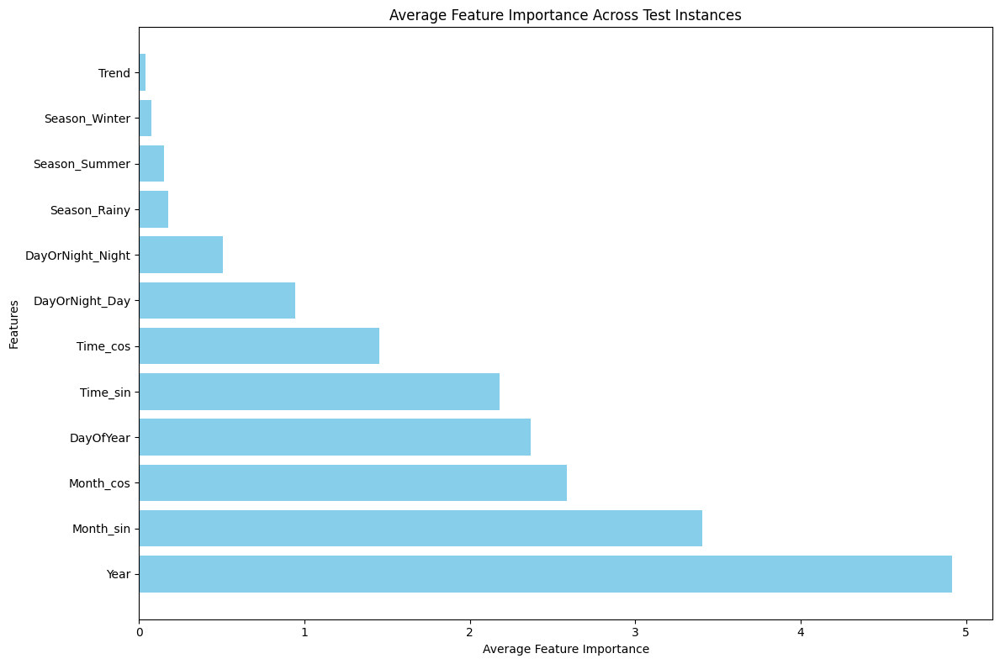

In [ ]:
# Define the prediction function
def predict_fn(X):
    X = np.reshape(X, (X.shape[0], 1, X.shape[1]))  # Reshape for LSTM input
    predictions = best_model.predict(X)
    return Dhaka_dew_point_target_scaler.inverse_transform(predictions).flatten()  # Inverse transform to original scale

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=features_scaled,
    feature_names=features.columns,
    mode='regression',  # For regression tasks
    training_labels=target_scaled.flatten()
)

# Number of instances to analyze
num_instances = min(len(X_test), 5)  # Adjust as needed

# Initialize arrays to store feature importances
feature_importances = np.zeros((num_instances, len(features.columns)))

# Generate explanations and aggregate feature importances
for i in range(num_instances):
    instance = X_test[i]  # Get instance
    explanation = explainer.explain_instance(
        instance.flatten(),  # Flatten for the explainer
        predict_fn,
        num_features=len(features.columns)
    )

    # Store feature importances
    importances = np.array([x[1] for x in explanation.as_list()])
    feature_importances[i, :] = importances

# Calculate average feature importance across instances
avg_feature_importances = np.mean(np.abs(feature_importances), axis=0)

# Plot feature importances
plt.figure(figsize=(12, 8))
feature_names = features.columns
plt.barh(feature_names, avg_feature_importances, color='skyblue')
plt.xlabel('Average Feature Importance')
plt.ylabel('Features')
plt.title('Average Feature Importance Across Test Instances')
plt.tight_layout()
plt.show()


## **2. SHAP**

## Identify the Important Features globally

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059743
DayOrNight_Day      DayOrNight_Day                  0.057968
DayOrNight_Night  DayOrNight_Night                  0.055658
Season_Summer        Season_Summer                  0.041684
Season_Winter        Season_Winter                  0.035503


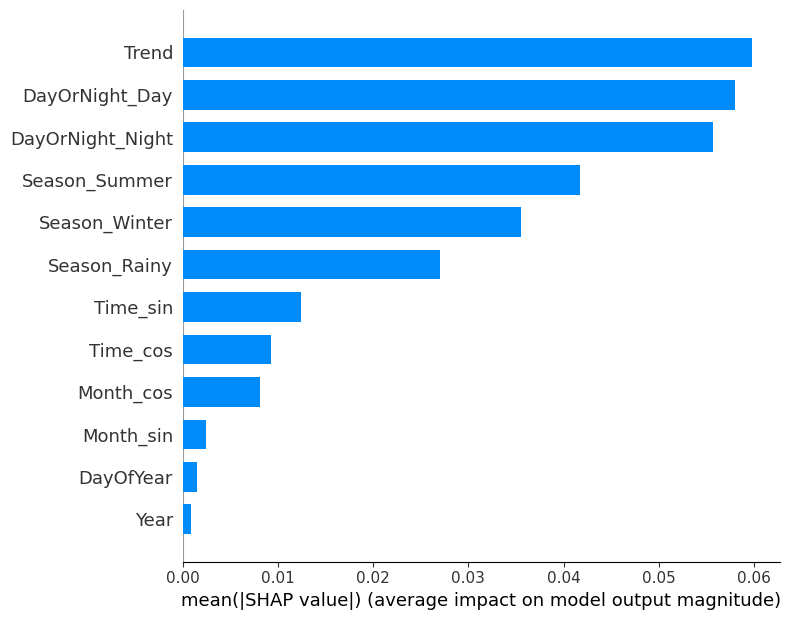

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a random sample from the test set
sample_size = 5  # Adjusted sample size
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_squeezed, X_test_sample_df, feature_names=feature_names, plot_type='bar')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059685
DayOrNight_Day      DayOrNight_Day                  0.057964
DayOrNight_Night  DayOrNight_Night                  0.055643
Season_Summer        Season_Summer                  0.041877
Season_Winter        Season_Winter                  0.035440


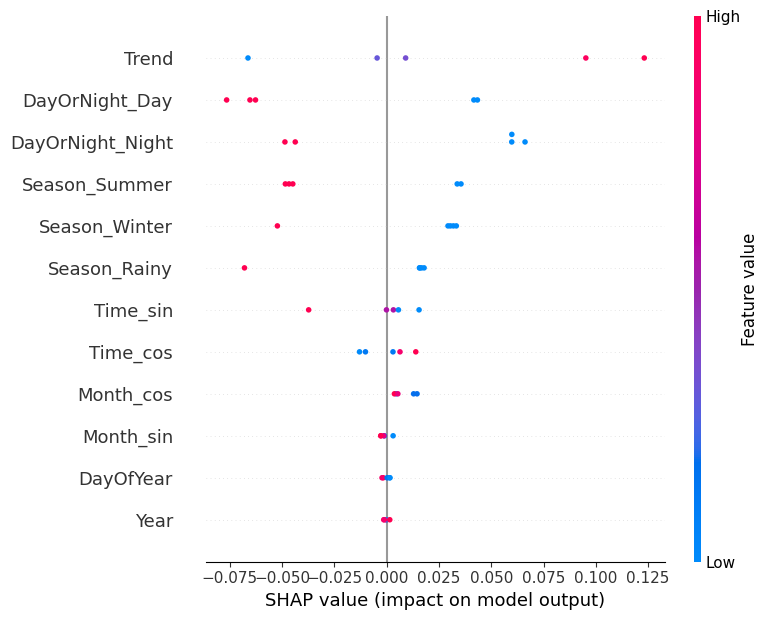

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values_squeezed, X_test_sample_df, feature_names=feature_names)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
                           Feature  Mean Absolute SHAP Value
Trend                        Trend                  0.059604
DayOrNight_Day      DayOrNight_Day                  0.058017
DayOrNight_Night  DayOrNight_Night                  0.055659
Season_Summer        Season_Summer                  0.041907
Season_Winter        Season_Winter                  0.035383


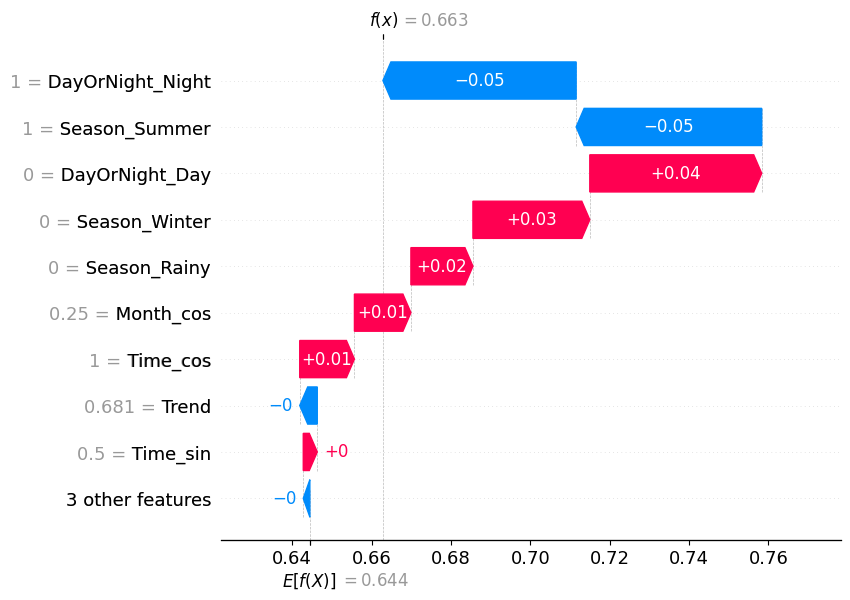

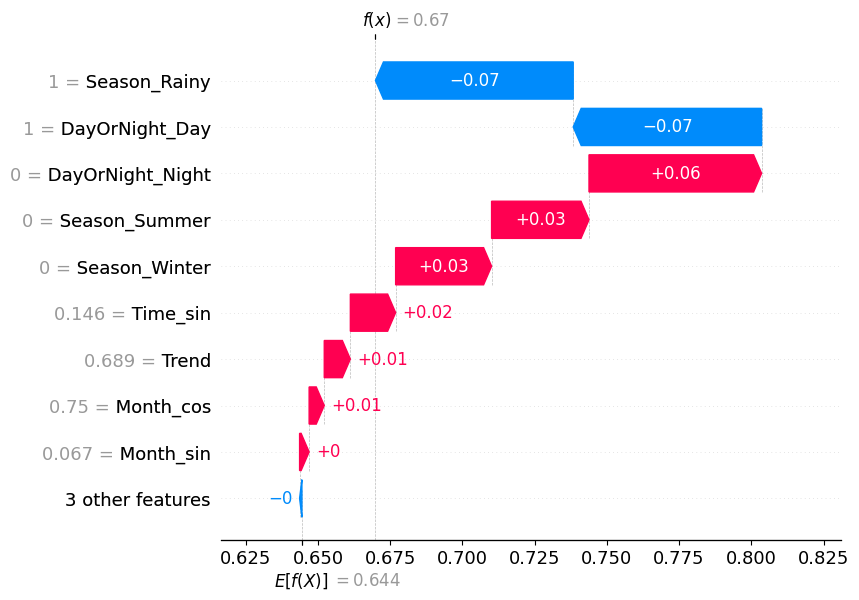

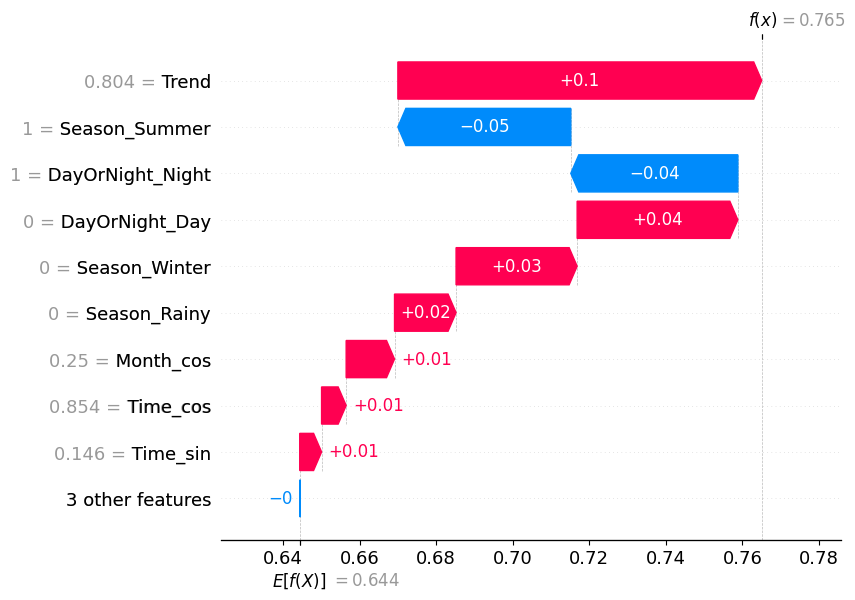

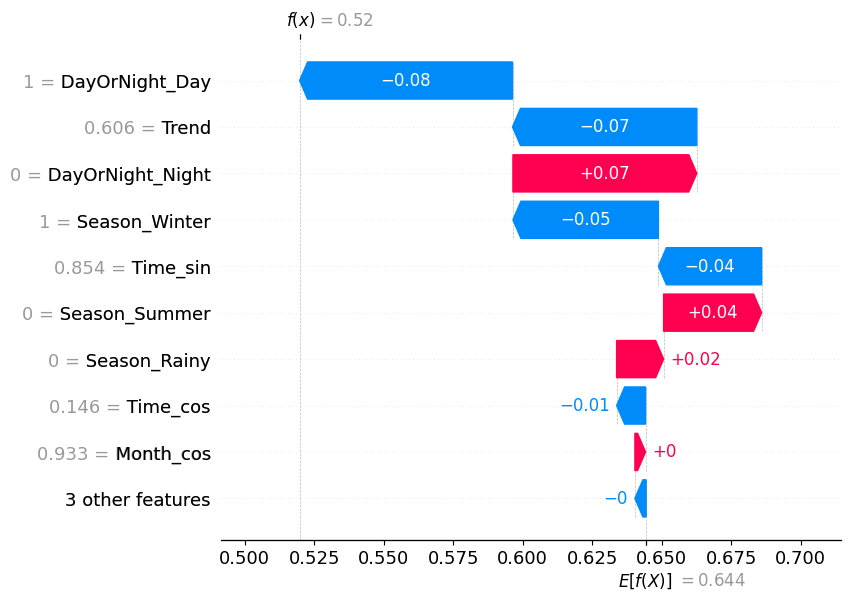

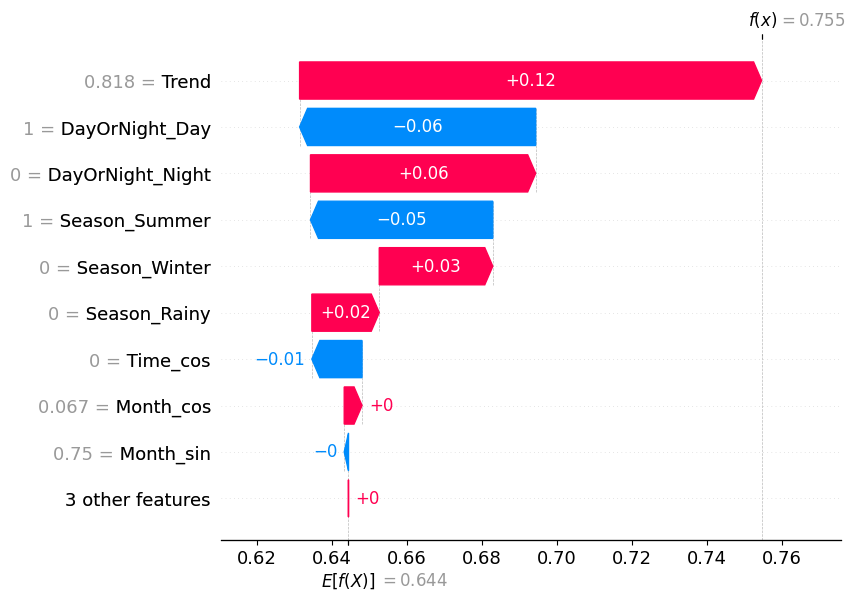

In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Display the top features by importance
print(importance_df.head())

# Plot the feature importance
plt.figure(figsize=(10, 6))

# Plot SHAP waterfall plot for the first few samples
for i in range(min(num_samples, X_test_sample_df.shape[0])):
    shap.waterfall_plot(shap.Explanation(
        values=shap_values_squeezed[i],
        base_values=explainer.expected_value,
        data=X_test_sample_df.iloc[i],
        feature_names=feature_names
    ))
    plt.show()



In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)


# Initialize JS visualization for SHAP
shap.initjs()

# Plot SHAP force plots for specific instances
for i in range(min(sample_size, X_test_sample_df.shape[0])):
    try:
        # Create a force plot for each instance
        force_plot = shap.force_plot(
            explainer.expected_value,
            shap_values_squeezed[i],
            X_test_sample_df.iloc[i],
            feature_names=feature_names
        )

        # Display the plot inline (for Jupyter Notebook/Colab)
        display(force_plot)

        # Optionally, save the plot as an image
        plt.savefig(f'shap_force_plot_{i}.png')
        plt.close()

    except Exception as e:
        print(f"Error generating force plot for sample {i}: {e}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


In [ ]:
# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 5  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Initialize JS visualization for SHAP
shap.initjs()

# Plot SHAP force plots for specific instances
for i in range(min(sample_size, X_test_sample_df.shape[0])):
    try:
        # Create a force plot for each instance
        force_plot = shap.force_plot(
            explainer.expected_value,
            shap_values_squeezed[i],
            X_test_sample_df.iloc[i],
            feature_names=feature_names
        )

        # Save the force plot as an HTML file
        force_plot_file = f'shap_force_plot_{i}.html'
        shap.save_html(force_plot_file, force_plot)

        print(f"Force plot saved as {force_plot_file}")

    except Exception as e:
        print(f"Error generating force plot for sample {i}: {e}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
324/324 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step


Force plot saved as shap_force_plot_0.html
Force plot saved as shap_force_plot_1.html
Force plot saved as shap_force_plot_2.html
Force plot saved as shap_force_plot_3.html
Force plot saved as shap_force_plot_4.html


In [ ]:
pip install html2image


In [ ]:
from html2image import Html2Image

# Initialize Html2Image
hti = Html2Image()

# Save the image from the HTML file
html_file_path = "shap_force_plot_0.html"
output_image_path = "shap_force_plot_0.png"

hti.screenshot(html_file=html_file_path, save_as=output_image_path)

print(f"Image saved as {output_image_path}")


FileNotFoundError: Could not find a Chrome executable on this machine, please specify it yourself.

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


  0%|          | 0/39 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2526/2526 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

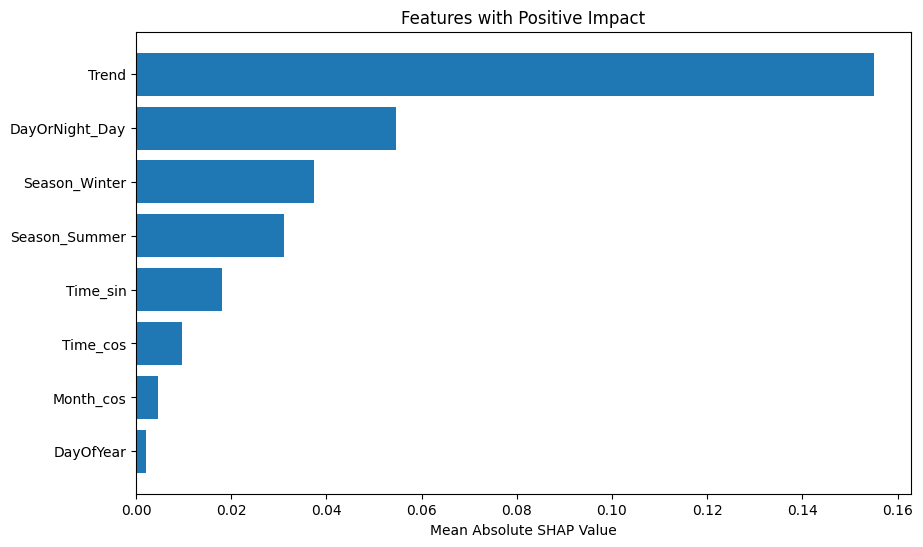

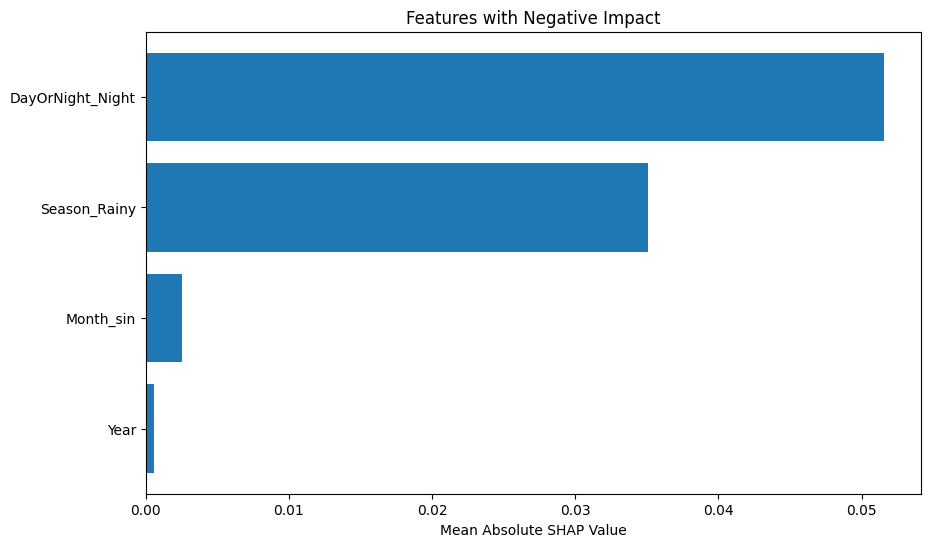

In [ ]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Extract the feature names as a list from the DataFrame columns
feature_names = features.columns.tolist()

# Reshape the training and testing data from 3D to 2D
X_train_2d = X_train.reshape(X_train.shape[0], X_train.shape[2])
X_test_2d = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Convert reshaped arrays into DataFrames using the extracted feature names
X_train_df = pd.DataFrame(X_train_2d, columns=feature_names)
X_test_df = pd.DataFrame(X_test_2d, columns=feature_names)

# Take a smaller random sample from the test set
sample_size = 39  # Adjust this based on available memory; try smaller sizes if necessary
X_test_sample_df = X_test_df.sample(n=sample_size, random_state=42)

# Define a wrapper function to reshape input back to 3D for prediction
def predict_wrapper(data):
    # Reshape to (batch_size, 1, num_features)
    data_reshaped = data.reshape(data.shape[0], 1, data.shape[1])
    return best_model.predict(data_reshaped)

# Initialize the SHAP explainer with the wrapper function using a sample of the training data
explainer = shap.KernelExplainer(predict_wrapper, X_train_df.sample(n=sample_size, random_state=42))

# Compute SHAP values for the test sample
shap_values = explainer.shap_values(X_test_sample_df)

# Squeeze to remove extra dimensions
shap_values_squeezed = np.squeeze(shap_values)

# Create a DataFrame for SHAP values
shap_values_df = pd.DataFrame(shap_values_squeezed, columns=feature_names)

# Calculate mean absolute SHAP values for feature importance
mean_shap = np.abs(shap_values_df).mean(axis=0)

# Create a DataFrame for feature importance
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Calculate the average SHAP value for each feature
average_shap = shap_values_df.mean(axis=0)

# Create a DataFrame for feature impact
impact_df = pd.DataFrame({
    'Feature': feature_names,
    'Average SHAP Value': average_shap,
    'Mean Absolute SHAP Value': mean_shap
})

# Sort by mean absolute SHAP value for overall importance
impact_df = impact_df.sort_values(by='Mean Absolute SHAP Value', ascending=False)

# Separate features into positive and negative impact
positive_impact_features = impact_df[impact_df['Average SHAP Value'] > 0]
negative_impact_features = impact_df[impact_df['Average SHAP Value'] < 0]

print("Positive Impact Features:")
print(positive_impact_features)

print("\nNegative Impact Features:")
print(negative_impact_features)

# Plot features with positive impact
plt.figure(figsize=(10, 6))
plt.barh(positive_impact_features['Feature'], positive_impact_features['Mean Absolute SHAP Value'])
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Features with Positive Impact')
plt.gca().invert_yaxis()
plt.show()

# Plot features with negative impact
plt.figure(figsize=(10, 6))
plt.barh(negative_impact_features['Feature'], negative_impact_features['Mean Absolute SHAP Value'])
plt.xlabel('Mean Absolute SHAP Value')
plt.title('Features with Negative Impact')
plt.gca().invert_yaxis()
plt.show()


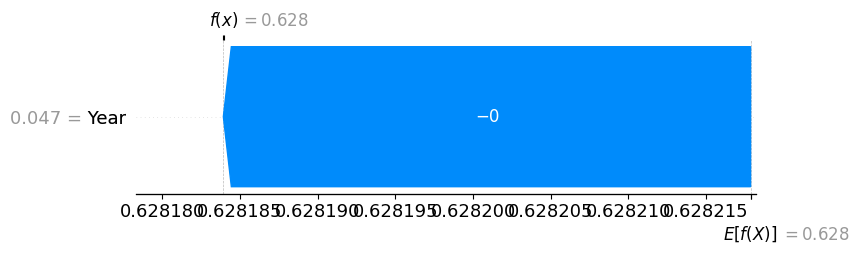

In [ ]:
# Ensure that shap_values is a list of arrays (one for each class or output)
# Select a single instance's SHAP values
shap_values_single_instance = shap_values[0][0]  # Adjust the index based on your model's output

# Plot the waterfall plot for the single instance
shap.waterfall_plot(shap.Explanation(
    values=shap_values_single_instance,
    base_values=explainer.expected_value,
    data=X_test_sample_df.iloc[0],
    feature_names=feature_names
))

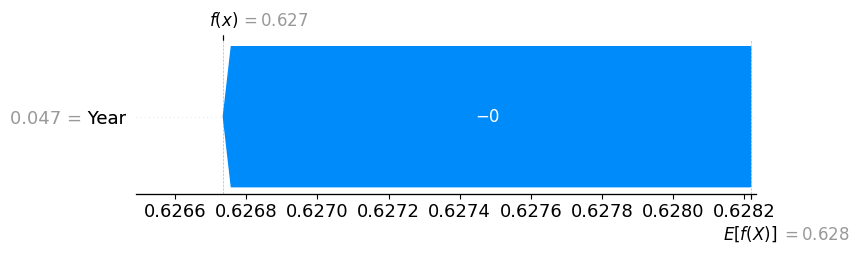

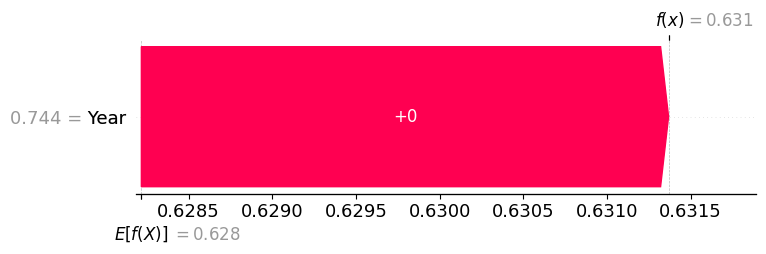

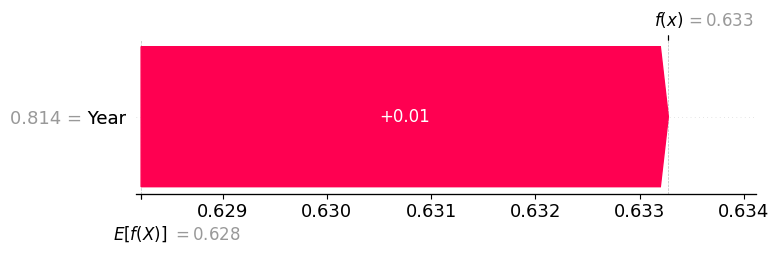

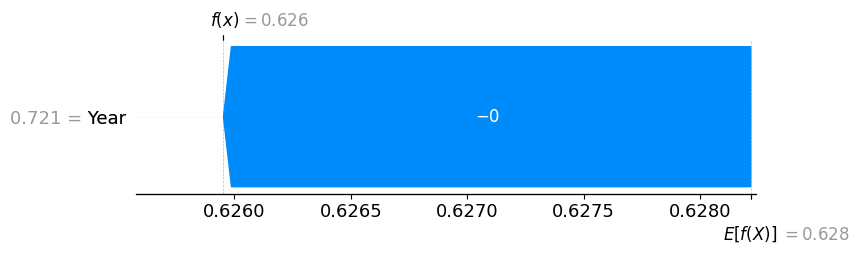

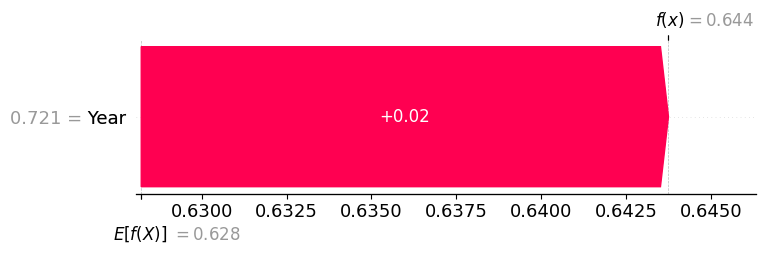

In [ ]:
# Example: Select the first few instances for detailed explanation
num_samples = 5  # Number of samples to plot
for i in range(num_samples):
    shap_values_single_instance = shap_values[1][i]
    shap.waterfall_plot(shap.Explanation(
        values=shap_values_single_instance,
        base_values=explainer.expected_value,
        data=X_test_sample_df.iloc[i],
        feature_names=feature_names
    ))